In [38]:
import os
import glob
import shutil
import numpy as np
import pandas as pd
from PIL import Image
import seaborn as sns
from time import time
import tensorflow as tf
import matplotlib.pyplot as plt
import tensorflow.keras as keras
from tensorflow.keras import optimizers
import tensorflow.keras.models as models
from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
import tensorflow.keras.estimator as estimator
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.applications import vgg16, vgg19, resnet, inception_v3
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, InputLayer
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array, array_to_img

np.random.seed(123)
data_dir = '/Users/jacksimonson/Springboard_Work/data/'

In [ ]:
# vgg19_model = vgg19.VGG19(include_top=False, weights='imagenet', input_shape=(250, 250, 3))

In [ ]:
def extract_bboxes(mask_path):

    """Compute bounding boxes from masks.

    mask: [height, width, num_instances]. Mask pixels are either 1 or 0.

 

    Returns: bbox array [num_instances, (y1, x1, y2, x2)].

    """
    mask = img_to_array(load_img(mask_path))
    mask[mask != 0] = 1

    m = mask[:, :, 0]

    # Bounding box.

    horizontal_indicies = np.where(np.any(m, axis=0))[0]

    vertical_indicies = np.where(np.any(m, axis=1))[0]

    if horizontal_indicies.shape[0]:

        x1, x2 = horizontal_indicies[[0, -1]]

        y1, y2 = vertical_indicies[[0, -1]]

        # x2 and y2 should not be part of the box. Increment by 1.

        x2 += 1

        y2 += 1

    else:

        # No mask for this instance. Might happen due to

        # resizing or cropping. Set bbox to zeros

        x1, x2, y1, y2 = 0, 0, 0, 0

    return [x1, y1, x2, y2]

In [ ]:
def fetch_preprocess_data(data_dir = '/Users/jacksimonson/Springboard_Work/data/',
                          img_dim = (250, 250)):
    start = time()
    print('Fetching data...')

    train_image_path = 'training-image'
    test_image_path = 'test-image'
    train_mask_path = 'training-mask'
    test_mask_path = 'test-mask'

    train_images = os.listdir(os.path.join(data_dir,train_image_path))
    test_images = os.listdir(os.path.join(data_dir,test_image_path))
    mask_train = os.listdir(os.path.join(data_dir,train_mask_path))
    mask_test = os.listdir(os.path.join(data_dir,test_mask_path))

    
    # find intersection of mammograms and masks
    train_image_names = [x.replace('.png','') for x in list(set(train_images).intersection(set(mask_train)))]
    test_image_names = [x.replace('.png','') for x in list(set(test_images).intersection(set(mask_test)))]
    
    # get all mammogram images
    files = glob.glob('{}{}/*'.format(data_dir, train_image_path))
    train_files = [f for f in files if f.split('/')[-1].replace('.png','') in train_image_names]

    files = glob.glob('{}{}/*'.format(data_dir, test_image_path))
    test_files = [f for f in files if f.split('/')[-1].replace('.png','') in test_image_names]
    
    # encode labels
    le = LabelEncoder()
    
    train_labels = [fn.split('/')[-1].split('_')[-1].replace('.png','').lower().strip() for fn in train_files]
    le.fit(train_labels)
    train_labels_enc = le.transform(train_labels)
    train_labels_enc = {f.split('/')[-1].replace('.png', ''): img for f, img in zip(train_files, train_labels_enc)}
    
    test_labels = [fn.split('/')[-1].split('_')[-1].replace('.png','').lower().strip() for fn in test_files]
    test_labels_enc = le.transform(test_labels)
    test_labels_enc = {f.split('/')[-1].replace('.png', ''): img for f, img in zip(test_files, test_labels_enc)}
    
    # get bounding boxes
    mask_train_images = [os.path.join(os.path.join(data_dir, train_mask_path), img_name) for img_name in mask_train]
    mask_test_images = [os.path.join(os.path.join(data_dir, test_mask_path), img_name) for img_name in mask_test]
    
    # get bounding boxes
    train_bound_boxes = {img.replace('.png','').split('/')[-1]: extract_bboxes(img) for img in mask_train_images if not img.endswith('.DS_Store')}
    test_bound_boxes = {img.replace('.png','').split('/')[-1]: extract_bboxes(img) for img in mask_test_images if not img.endswith('.DS_Store')}

    
    
    train_index = list(train_bound_boxes.keys())
    test_index = list(test_bound_boxes.keys())
    train_image_data = pd.DataFrame({'label': [], 'box': [], 'path': []})
    test_image_data = pd.DataFrame({'label': [], 'box': [], 'path': []})
    
    for i in train_index:
        if all([i in x for x in [list(train_labels_enc.keys()), list(train_bound_boxes.keys())]]):
            new_row = pd.Series({'label': train_labels_enc[i], 'box': train_bound_boxes[i],
                                 'path': os.path.join(os.path.join(data_dir,train_image_path), i + '.png')})
            new_row.name = i
            train_image_data = train_image_data.append(new_row)

    for i in test_index:
        if all([i in x for x in [list(test_labels_enc.keys()), list(test_bound_boxes.keys())]]):
            new_row = pd.Series({'label': test_labels_enc[i], 'box': test_bound_boxes[i],
                                 'path': os.path.join(os.path.join(data_dir,test_image_path), i + '.png')})
            new_row.name = i
            test_image_data = test_image_data.append(new_row)
    

    train_image_data.to_json(os.path.join(data_dir, 'training_image_data.json'))
    test_image_data.to_json(os.path.join(data_dir, 'test_image_data.json'))
    
    
    end = time()
    elapsed = (end - start)/60
    print('\nData processing time is %f minutes.' % elapsed)
    return train_image_data, test_image_data

In [ ]:
train_image_data, test_image_data = fetch_preprocess_data(data_dir = '/Users/jacksimonson/Springboard_Work/data/', img_dim = (250, 250))

In [26]:
# train_image_data = pd.read_json('/Users/jacksimonson/Springboard_Work/data/training_image_data.json')
# test_image_data = pd.read_json('/Users/jacksimonson/Springboard_Work/data/test_image_data.json')

In [27]:
train_image_data

,label,box,path
Mass-Training_P_01596_RIGHT_MLO_MALIGNANT,1,"[410, 3491, 720, 3827]",/Users/jacksimonson/Springboard_Work/data/trai...
Calc-Training_P_00835_LEFT_CC_MALIGNANT,1,"[1886, 3092, 2071, 3213]",/Users/jacksimonson/Springboard_Work/data/trai...
Mass-Training_P_00719_LEFT_MLO_MALIGNANT,1,"[0, 2712, 367, 3209]",/Users/jacksimonson/Springboard_Work/data/trai...
Mass-Training_P_00068_RIGHT_MLO_MALIGNANT,1,"[1919, 907, 2314, 1205]",/Users/jacksimonson/Springboard_Work/data/trai...
Calc-Training_P_01315_LEFT_CC_MALIGNANT,1,"[1925, 1139, 2158, 1308]",/Users/jacksimonson/Springboard_Work/data/trai...
...,...,...,...
Mass-Training_P_00247_RIGHT_CC_BENIGN,0,"[2203, 2362, 2581, 2670]",/Users/jacksimonson/Springboard_Work/data/trai...
Mass-Training_P_00959_RIGHT_MLO_MALIGNANT,1,"[2113, 1634, 2401, 1956]",/Users/jacksimonson/Springboard_Work/data/trai...
Calc-Training_P_00654_RIGHT_CC_MALIGNANT,1,"[1520, 2544, 1785, 2769]",/Users/jacksimonson/Springboard_Work/data/trai...
Calc-Training_P_00364_RIGHT_CC_BENIGN,0,"[3320, 2848, 3529, 3057]",/Users/jacksimonson/Springboard_Work/data/trai...


In [28]:
labels_to_name = {0.0: 'benign', 1.0: 'malignant'}

In [29]:
import urllib
PRETRAINED_MODEL = '/Users/jacksimonson/Springboard_Work/CBIS Code/snapshots/resnet_pretrained_model.h5'
URL_MODEL = 'https://github.com/fizyr/keras-retinanet/releases/download/0.5.1/resnet50_coco_best_v2.1.0.h5'
urllib.request.urlretrieve(URL_MODEL, PRETRAINED_MODEL)
print('Downloaded pretrained model to ' + PRETRAINED_MODEL)

Downloaded pretrained model to /Users/jacksimonson/Springboard_Work/CBIS Code/snapshots/resnet_pretrained_model.h5


In [30]:
dataset = dict()
dataset["image_name"] = list()
dataset["top_x"] = list()
dataset["top_y"] = list()
dataset["bottom_x"] = list()
dataset["bottom_y"] = list()
dataset["class_name"] = list()
counter = 0
for index, row in train_image_data.iterrows():
    dataset['image_name'].append(row['path'])
    x1, y1, x2, y2 = row['box']
    width = x2 - x1
    height = y2-y1

    dataset["top_x"].append(
      int(round(x1))
    )
    dataset["top_y"].append(
      int(round(y1))
    )
    dataset["bottom_x"].append(
      int(round(x2))
    )
    dataset["bottom_y"].append(
      int(round(y2))
    )
    dataset["class_name"].append(labels_to_name[row['label']])
    counter += 1
train_df = pd.DataFrame(dataset)

In [31]:
dataset = dict()
dataset["image_name"] = list()
dataset["top_x"] = list()
dataset["top_y"] = list()
dataset["bottom_x"] = list()
dataset["bottom_y"] = list()
dataset["class_name"] = list()
counter = 0
for index, row in train_image_data.iterrows():
    dataset['image_name'].append(row['path'])
    x1, y1, x2, y2 = row['box']
    width = x2 - x1
    height = y2-y1

    dataset["top_x"].append(
      int(round(x1))
    )
    dataset["top_y"].append(
      int(round(y1))
    )
    dataset["bottom_x"].append(
      int(round(x2))
    )
    dataset["bottom_y"].append(
      int(round(y2))
    )
    dataset["class_name"].append(labels_to_name[row['label']])
    counter += 1
test_df = pd.DataFrame(dataset)

In [32]:
test_df.head()

,image_name,top_x,top_y,bottom_x,bottom_y,class_name
0,/Users/jacksimonson/Springboard_Work/data/trai...,410,3491,720,3827,malignant
1,/Users/jacksimonson/Springboard_Work/data/trai...,1886,3092,2071,3213,malignant
2,/Users/jacksimonson/Springboard_Work/data/trai...,0,2712,367,3209,malignant
3,/Users/jacksimonson/Springboard_Work/data/trai...,1919,907,2314,1205,malignant
4,/Users/jacksimonson/Springboard_Work/data/trai...,1925,1139,2158,1308,malignant


In [33]:
ANNOTATIONS_FILE = os.path.join(data_dir, 'annotations.csv')
CLASSES_FILE = os.path.join(data_dir, 'classes.csv')

In [34]:
PRETRAINED_MODEL

'/Users/jacksimonson/Springboard_Work/CBIS Code/snapshots/resnet_pretrained_model.h5'

In [35]:
train_df.to_csv(ANNOTATIONS_FILE, index=False, header=None)

In [36]:
classes = set(train_df['class_name'])
with open(CLASSES_FILE, 'w') as f:
    for i, line in enumerate(sorted(classes)):
        f.write('{},{}\n'.format(line,i))

In [39]:
!/Users/jacksimonson/Springboard_Work/keras-retinanet/keras_retinanet/bin/train.py \
 --freeze-backbone \
 --random-transform \
 --weights '/Users/jacksimonson/Springboard_Work/CBIS Code/snapshots/resnet_pretrained_model.h5' \
 --batch-size 8 \
 --steps 30 \
 --epochs 5 \
 csv "/Users/jacksimonson/Springboard_Work/data/annotations.csv" "/Users/jacksimonson/Springboard_Work/data/classes.csv"

Creating model, this may take a second...
2020-08-25 16:33:00.386130: I tensorflow/core/platform/cpu_feature_guard.cc:143] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2020-08-25 16:33:00.400816: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7ff1404423c0 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
2020-08-25 16:33:00.400833: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): Host, Default Version
Model: "retinanet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, None, No

Total params: 36,403,702
Trainable params: 12,842,550
Non-trainable params: 23,561,152
__________________________________________________________________________________________________
None
Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/5
30/30 [==============================] - ETA: 0s - loss: 3.8521 - regression_loss: 2.7228 - classification_loss: 1.1293 - regression_accuracy: 0.2311 - classification_accuracy: 0.6339 
Epoch 00001: saving model to ./snapshots/resnet50_csv_01.h5
30/30 [==============================] - 463s 15s/step - loss: 3.8521 - regression_loss: 2.7228 - classification_loss: 1.1293 - regression_accuracy: 0.2311 - classification_accuracy: 0.6339 - lr: 1.0000e-05
Epoch 2/5
30/30 [==============================] - ETA: 0s - loss: 3.5091 - regression_loss: 2.4796 - classification_loss: 1.0295 - regression_accuracy: 0.3365 - classification_accuracy: 0.6093 
Epoch 00002: saving model to ./snapshots/resnet50_csv_02.h5
30/30 [=========

In [40]:
# show images inline
%matplotlib inline

# automatically reload modules when they have changed
%load_ext autoreload
%autoreload 2

# import keras
import keras

# import keras_retinanet
from keras_retinanet import models
from keras_retinanet.utils.image import read_image_bgr, preprocess_image, resize_image
from keras_retinanet.utils.visualization import draw_box, draw_caption
from keras_retinanet.utils.colors import label_color
from keras_retinanet.utils.gpu import setup_gpu

# import miscellaneous modules
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np
import time

# use this to change which GPU to use
gpu = 0

# set the modified tf session as backend in keras
setup_gpu(gpu)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [41]:
# !retinanet-convert-model "/Users/jacksimonson/Springboard_Work/CBIS Code/snapshots/resnet50_csv_10.h5" "/Users/jacksimonson/Springboard_Work/CBIS Code/snapshots/resnet50_csv_10_inference.h5"

In [42]:
# adjust this to point to your downloaded/trained model
# models can be downloaded here: https://github.com/fizyr/keras-retinanet/releases
model_path = os.path.join('/Users/jacksimonson/Springboard_Work/CBIS Code/snapshots', 'resnet50_csv_05.h5')

# load retinanet model
model = models.load_model(model_path, backbone_name='resnet50')

# if the model is not converted to an inference model, use the line below
# see: https://github.com/fizyr/keras-retinanet#converting-a-training-model-to-inference-model
model = models.convert_model(model)

#print(model.summary())

In [43]:
# load label to names mapping for visualization purposes
labels_to_names = {0.0: 'benign', 1.0: 'malignant'}

In [44]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

In [45]:
test_image_data = pd.read_json('/Users/jacksimonson/Springboard_Work/data/test_image_data.json')
test_image_data.head()

,label,box,path
Mass-Test_P_01765_RIGHT_CC_BENIGN,0,"[1550, 2529, 1874, 2927]",/Users/jacksimonson/Springboard_Work/data/test...
Calc-Test_P_00257_RIGHT_MLO_BENIGN,0,"[1752, 3040, 2049, 3345]",/Users/jacksimonson/Springboard_Work/data/test...
Calc-Test_P_01471_RIGHT_MLO_MALIGNANT,1,"[22, 2512, 163, 2773]",/Users/jacksimonson/Springboard_Work/data/test...
Mass-Test_P_01666_RIGHT_CC_MALIGNANT,1,"[1524, 2022, 1753, 2331]",/Users/jacksimonson/Springboard_Work/data/test...
Calc-Test_P_00643_LEFT_MLO_MALIGNANT,1,"[1322, 3452, 1693, 3748]",/Users/jacksimonson/Springboard_Work/data/test...


In [52]:
def draw_detections(image, boxes, scores, labels):
    idx = 0
    for box, score, label in zip(boxes[0], scores[0], labels[0]):
#         if idx > 25:
#             break
        color = label_color(label)
        b = box.astype(int)
        caption = "{} {:.3f}".format(labels_to_names[label], score)
        if idx > 0:
            draw_box(image, b, color=color)
        else:
            draw_box(image, b, color=color, thickness=5)
        draw_caption(image, b, caption)
        idx += 1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  10.17584490776062
actual: benign
predicted: malignant


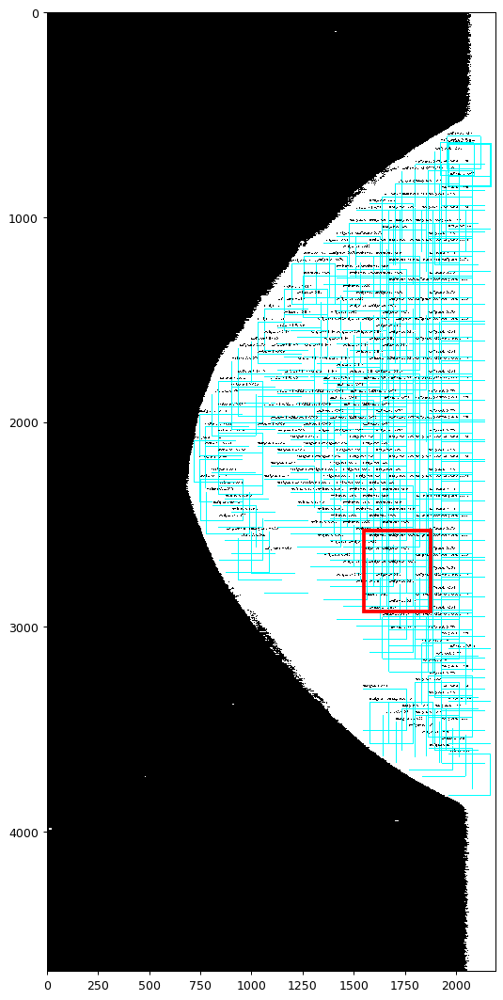

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


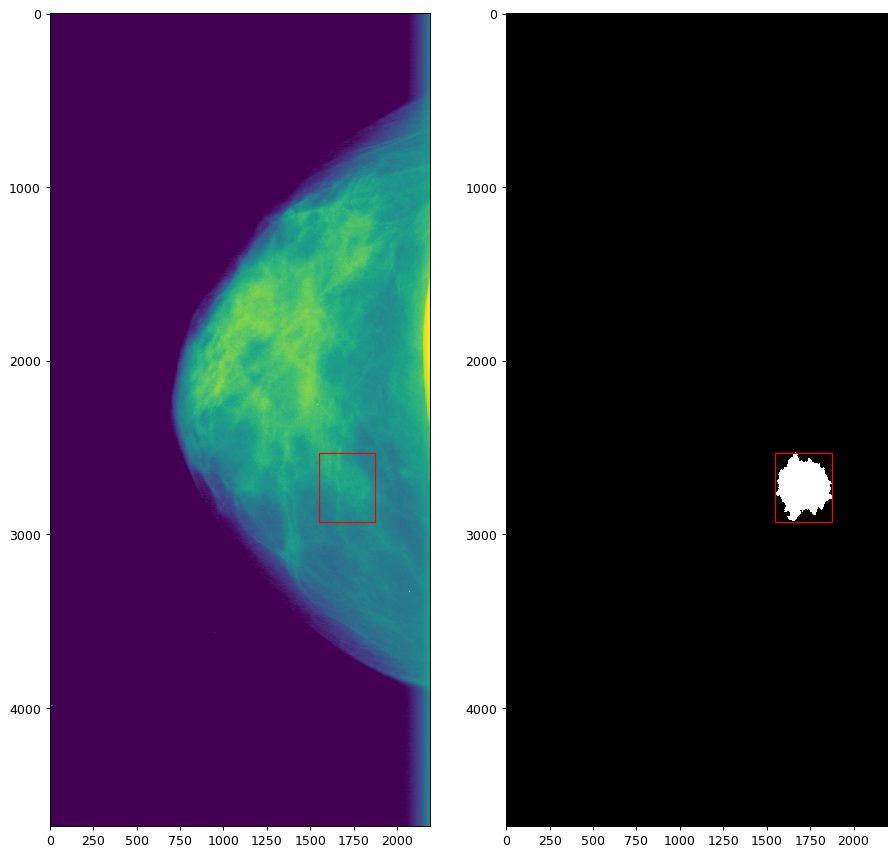

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  12.29533314704895
actual: benign
predicted: malignant


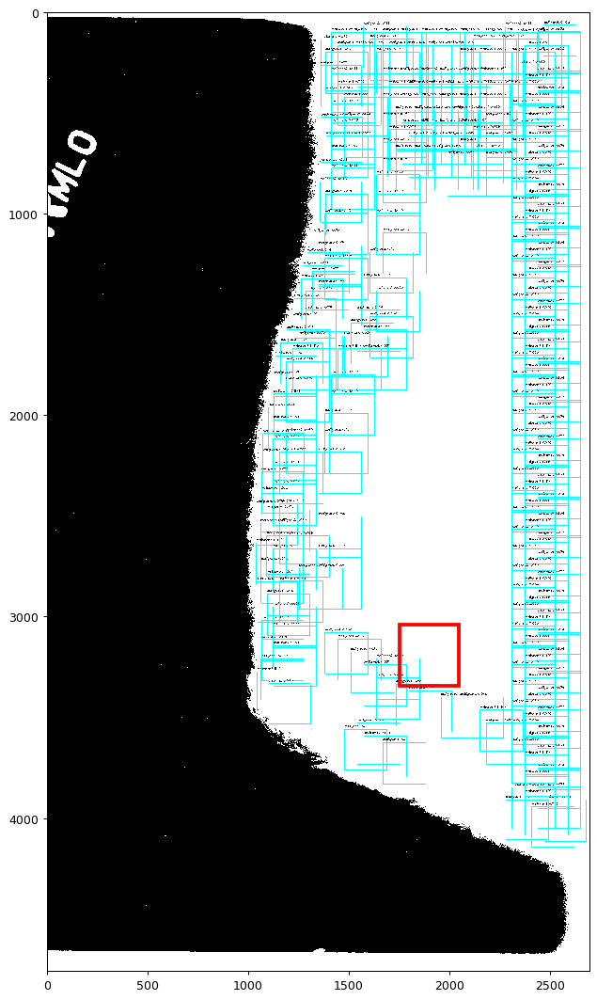

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


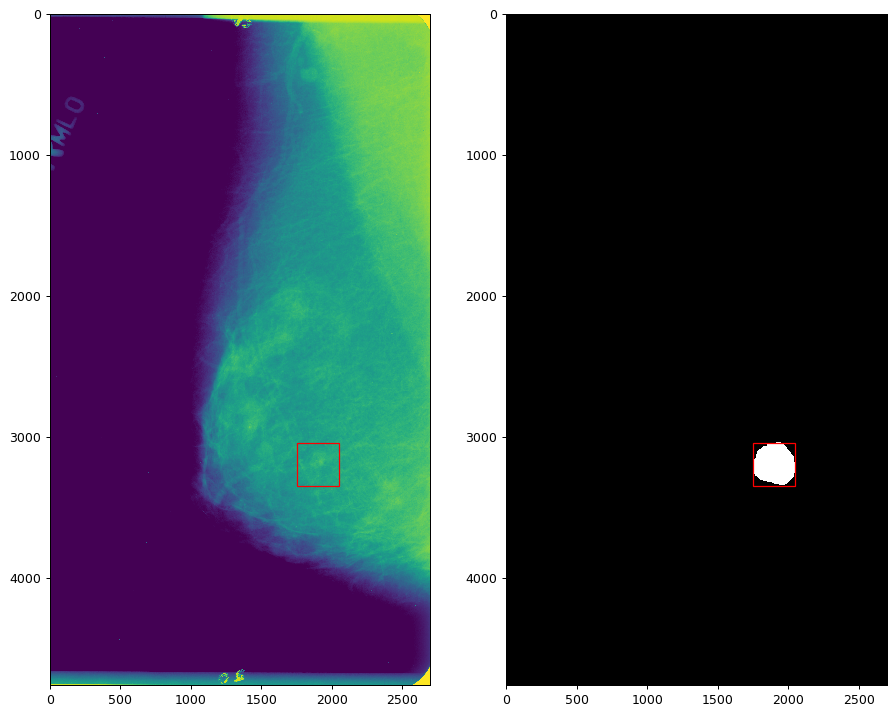

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  10.238006114959717
actual: malignant
predicted: malignant


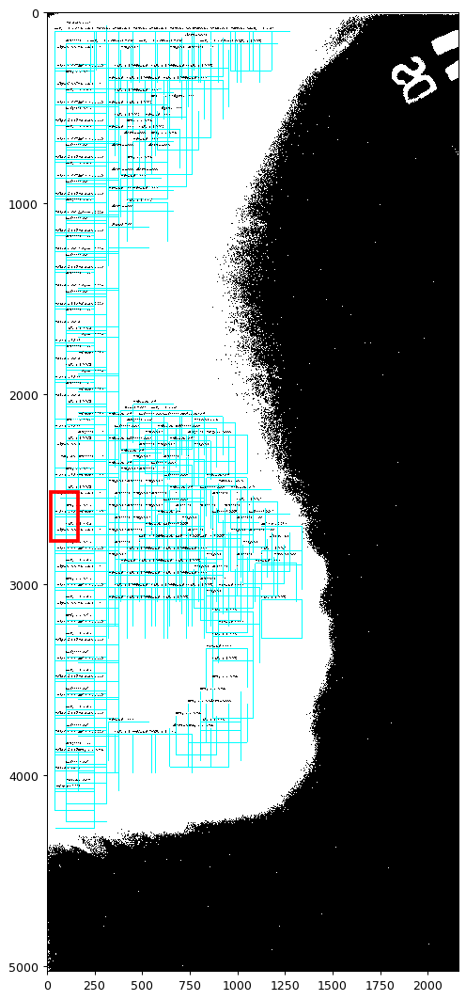

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


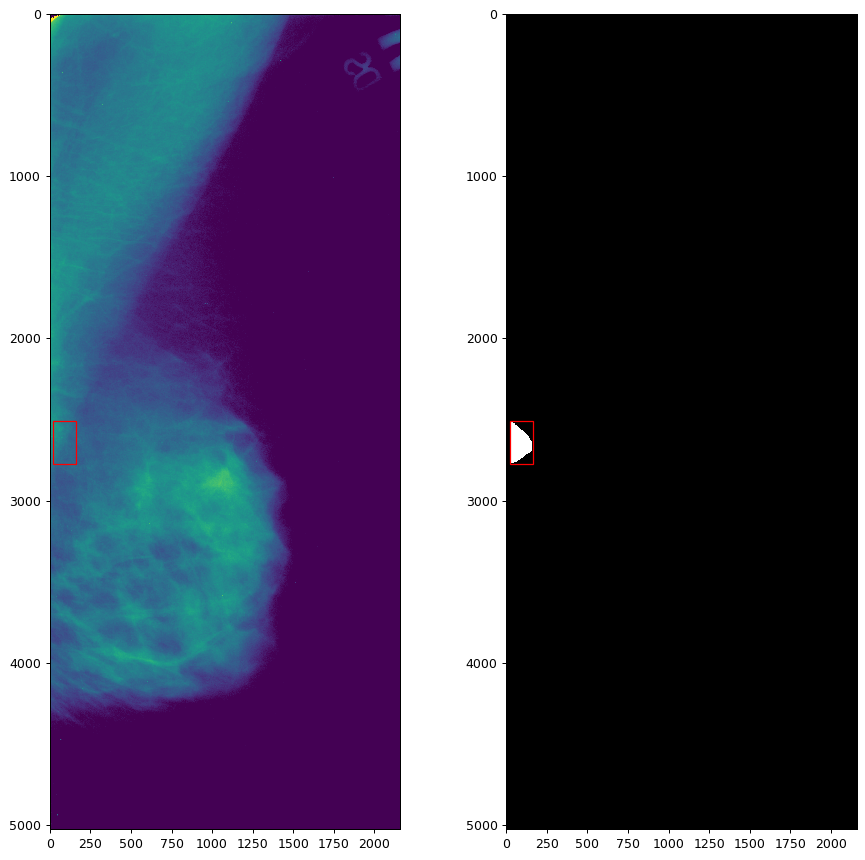

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  12.877544403076172
actual: malignant
predicted: malignant


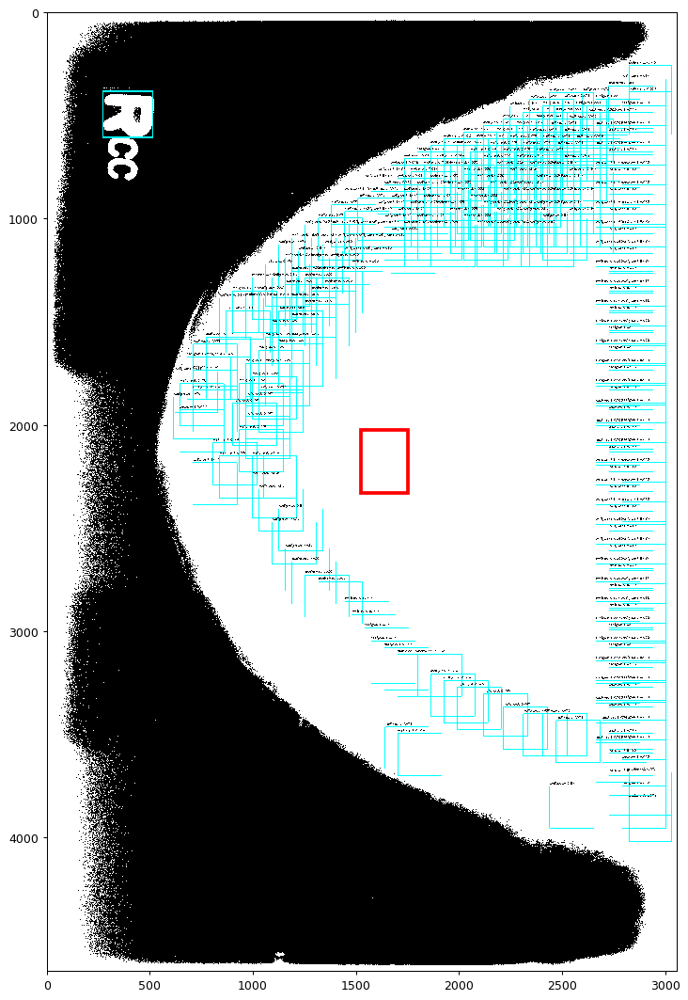

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


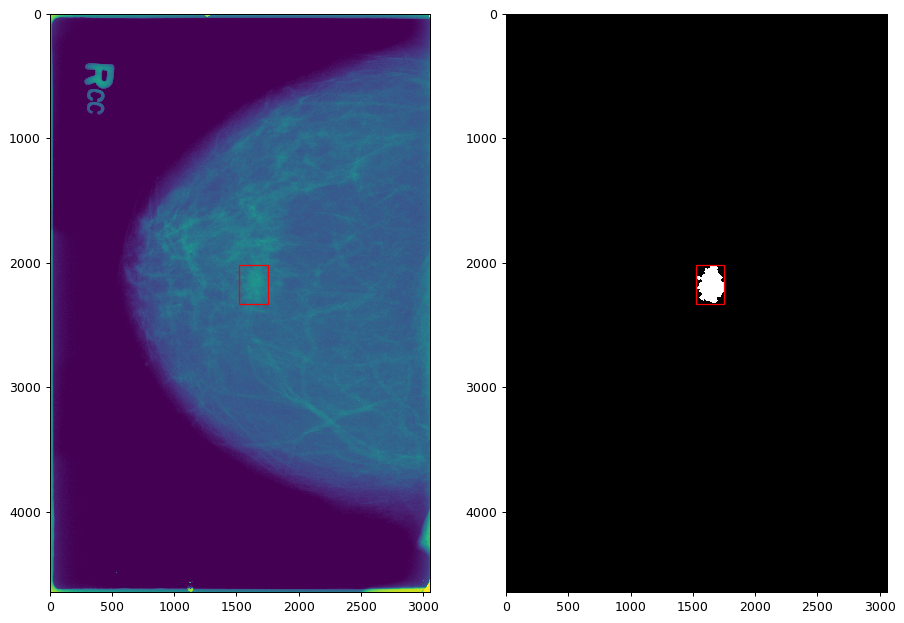

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  12.275434970855713
actual: malignant
predicted: malignant


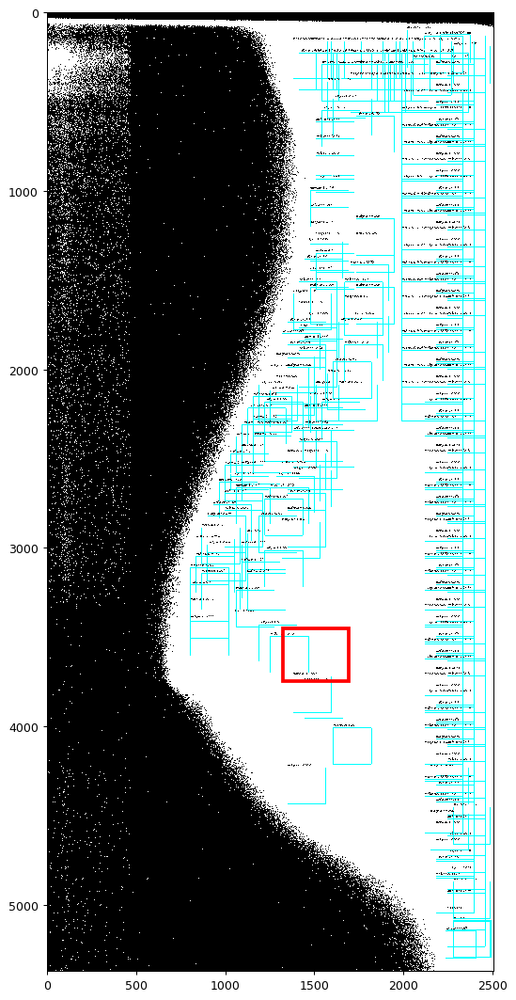

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


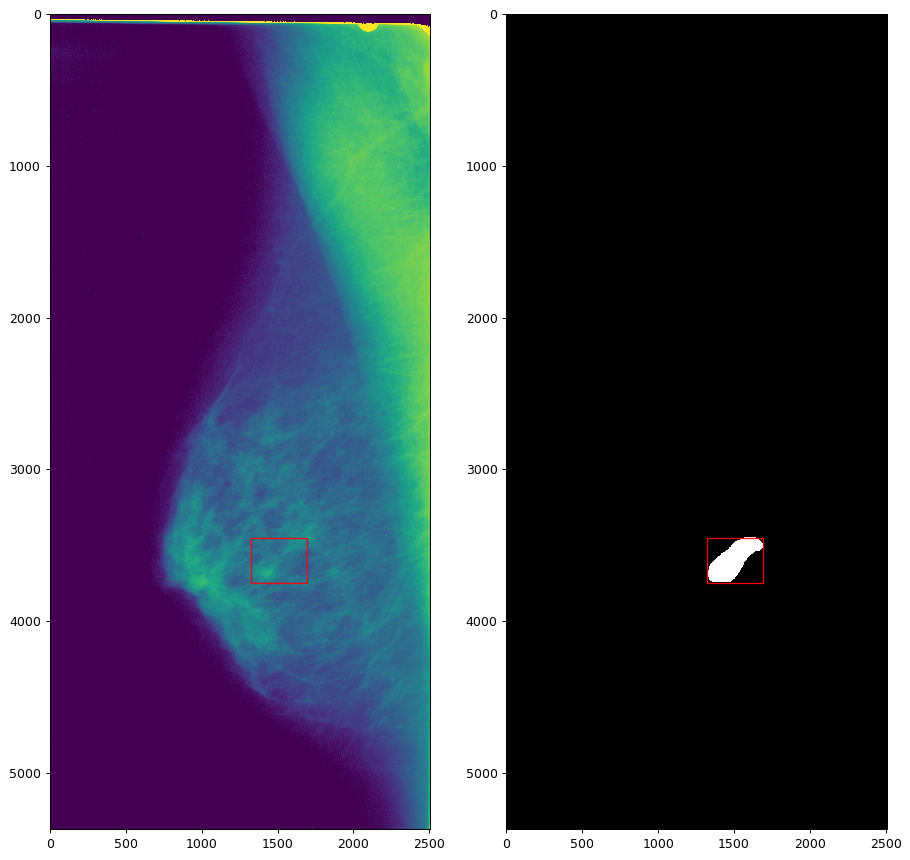

processing time:  21.468078136444092
actual: malignant
predicted: malignant


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


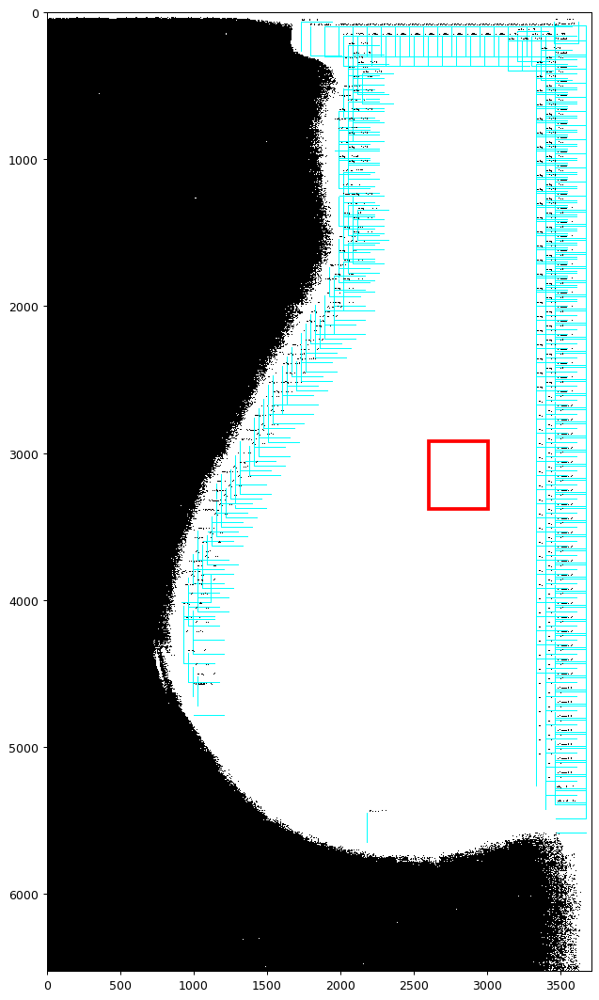

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


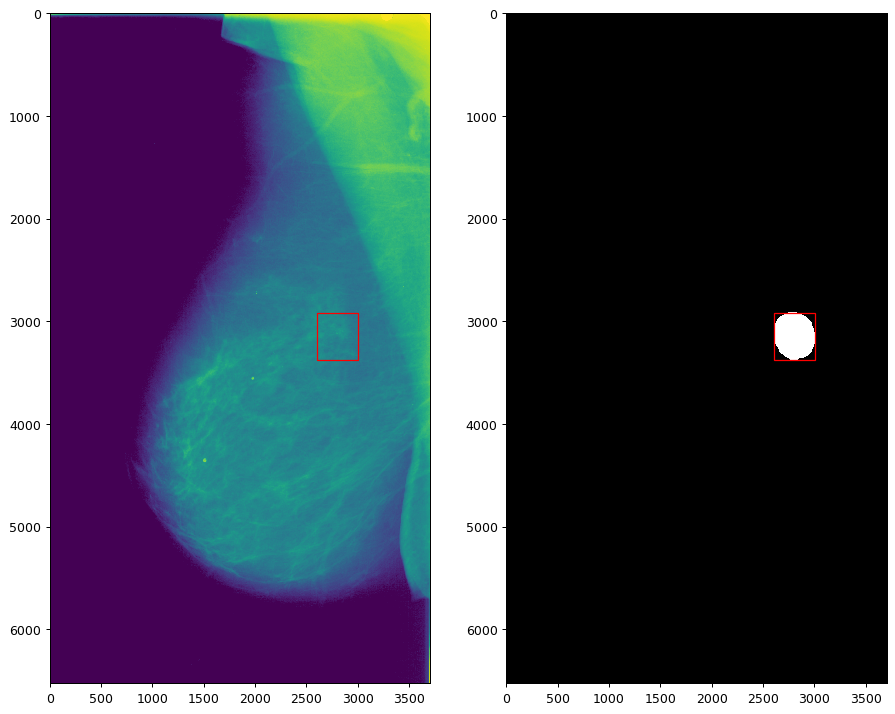

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  11.347413063049316
actual: benign
predicted: malignant


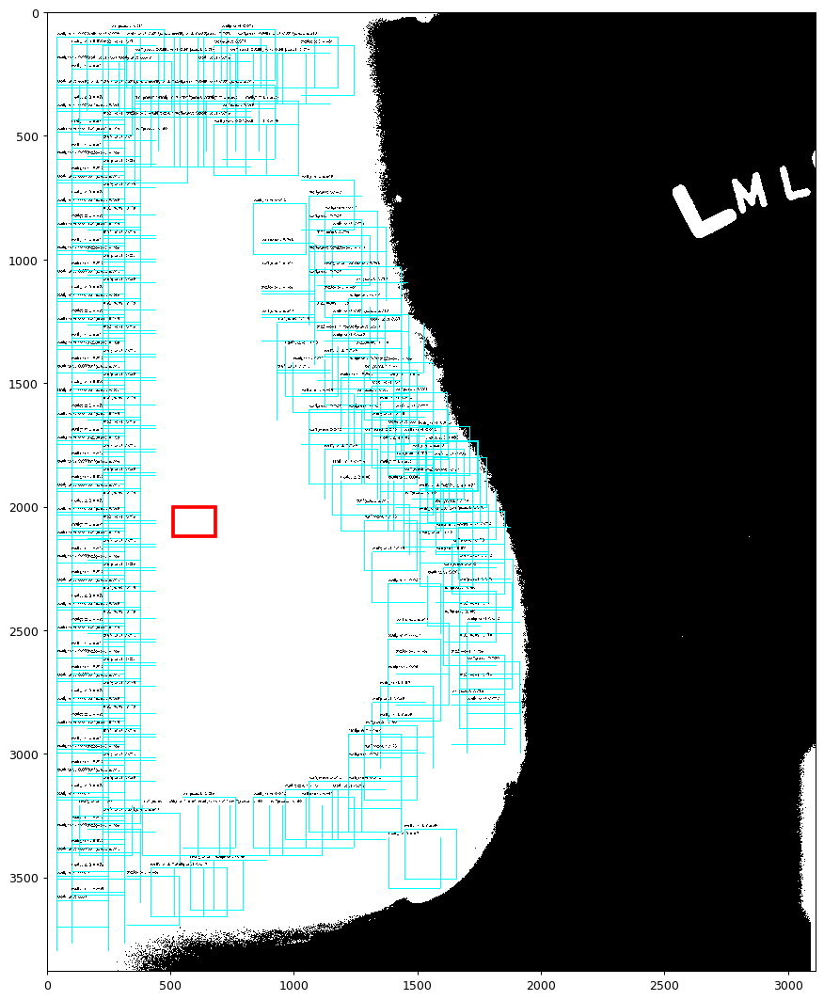

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


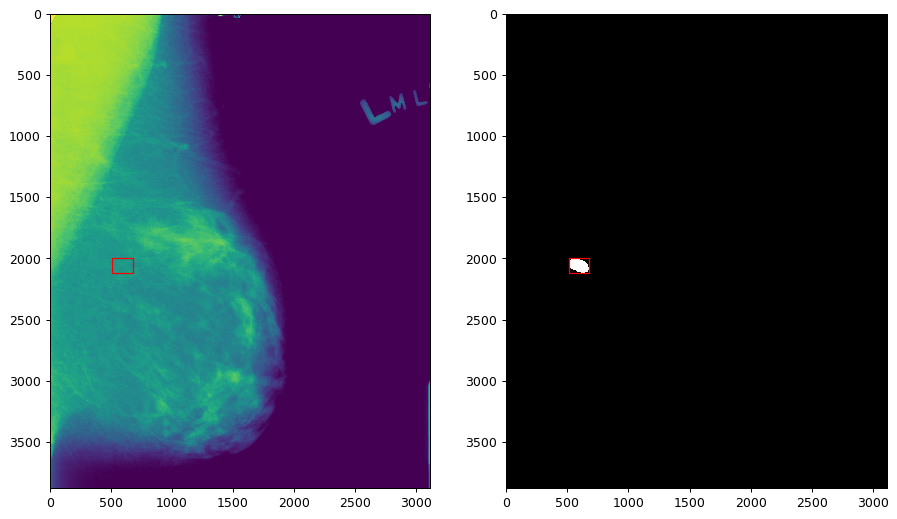

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  20.460136890411377
actual: benign
predicted: malignant


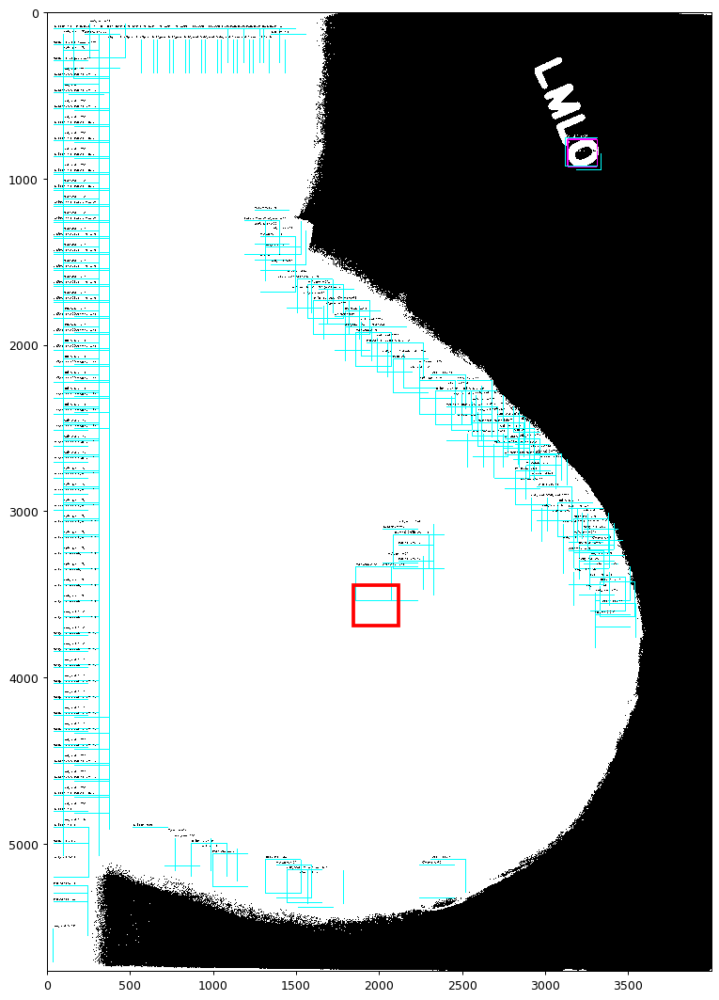

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


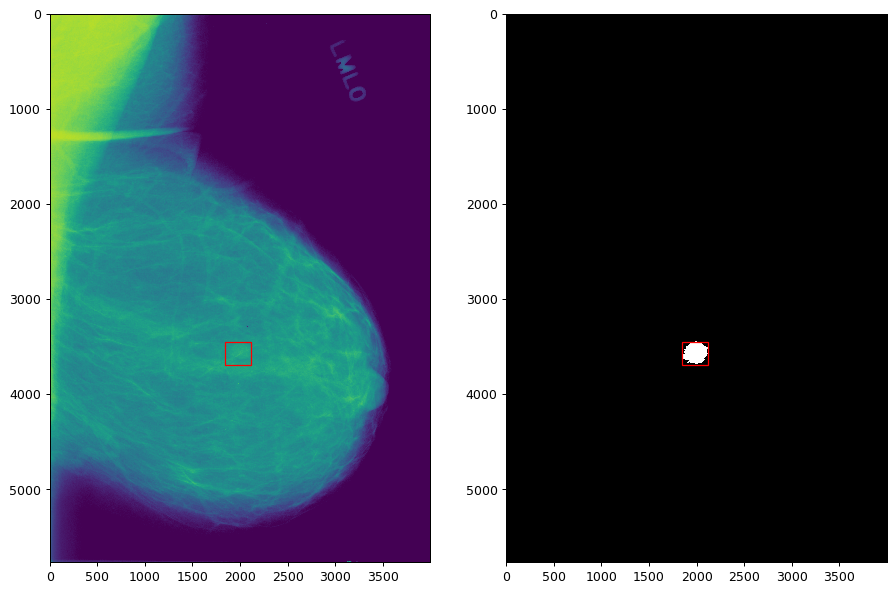

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  10.203492879867554
actual: malignant
predicted: malignant


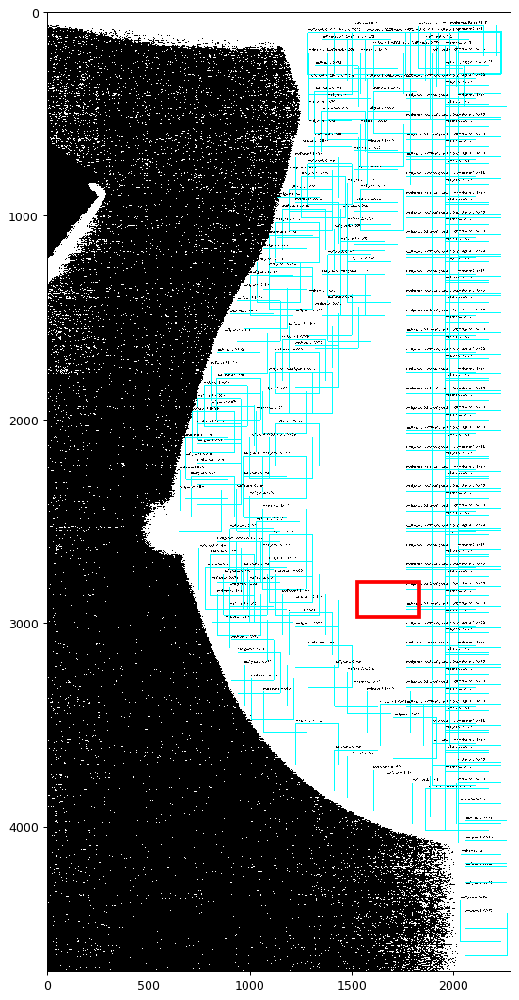

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


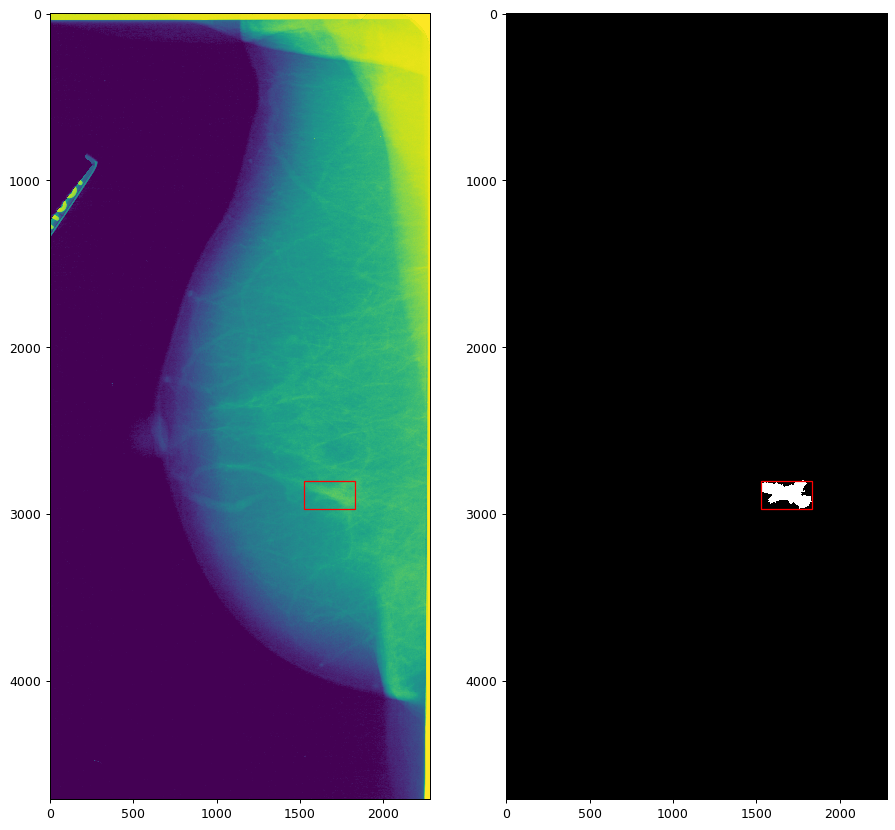

processing time:  26.70232605934143
actual: malignant
predicted: malignant


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


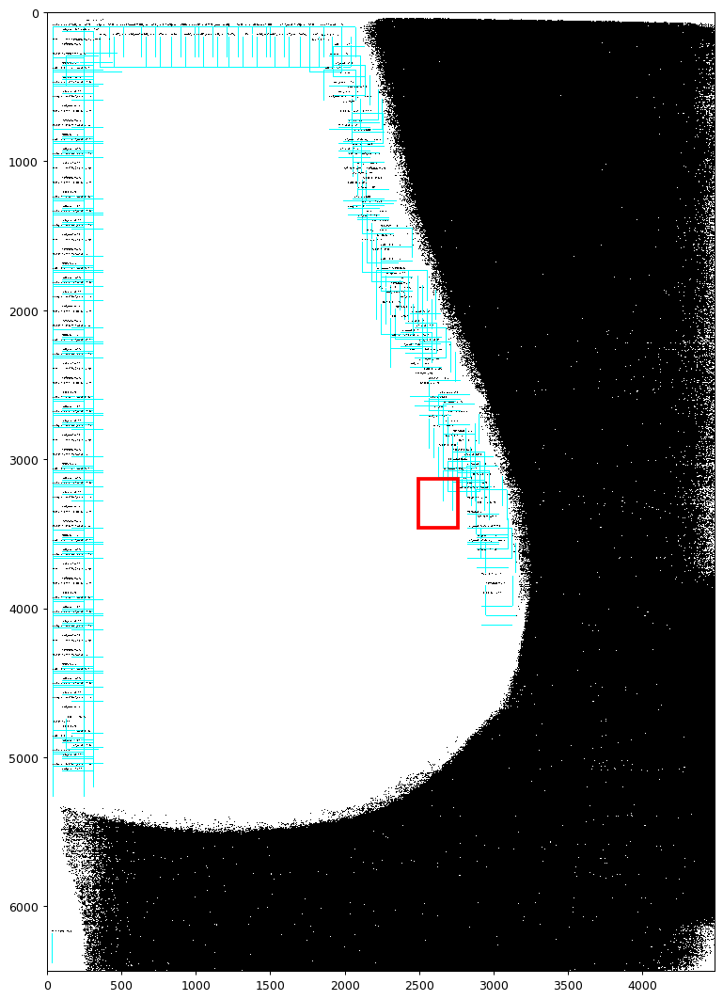

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


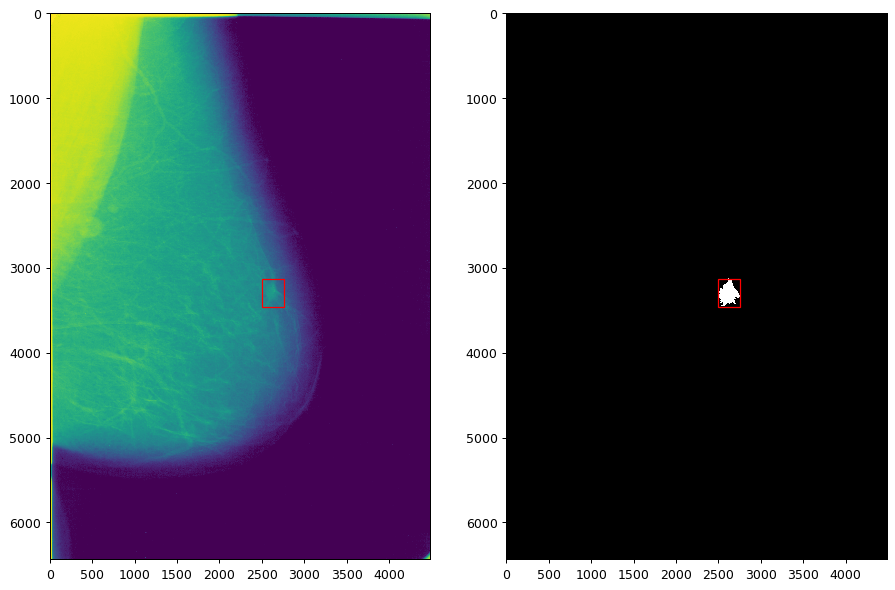

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  11.97804307937622
actual: benign
predicted: malignant


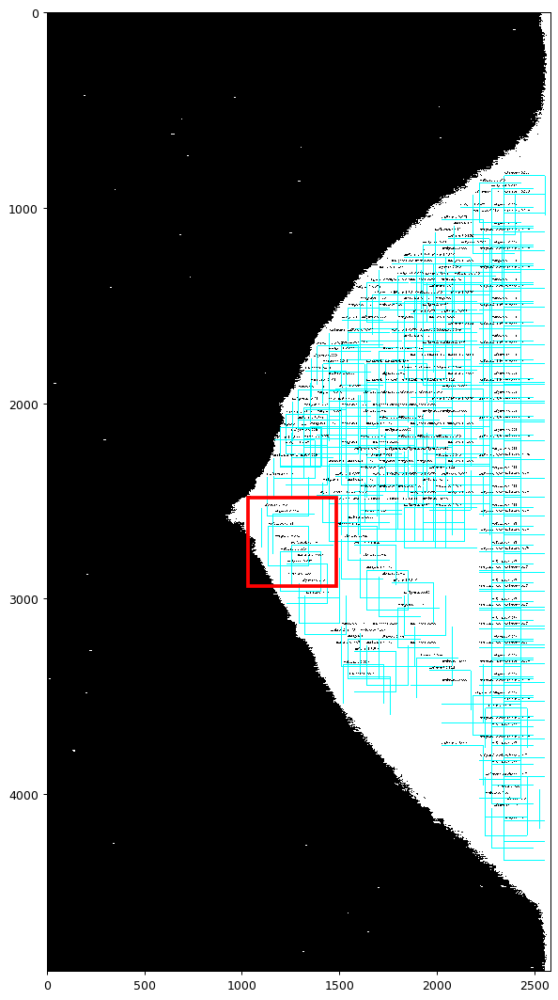

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


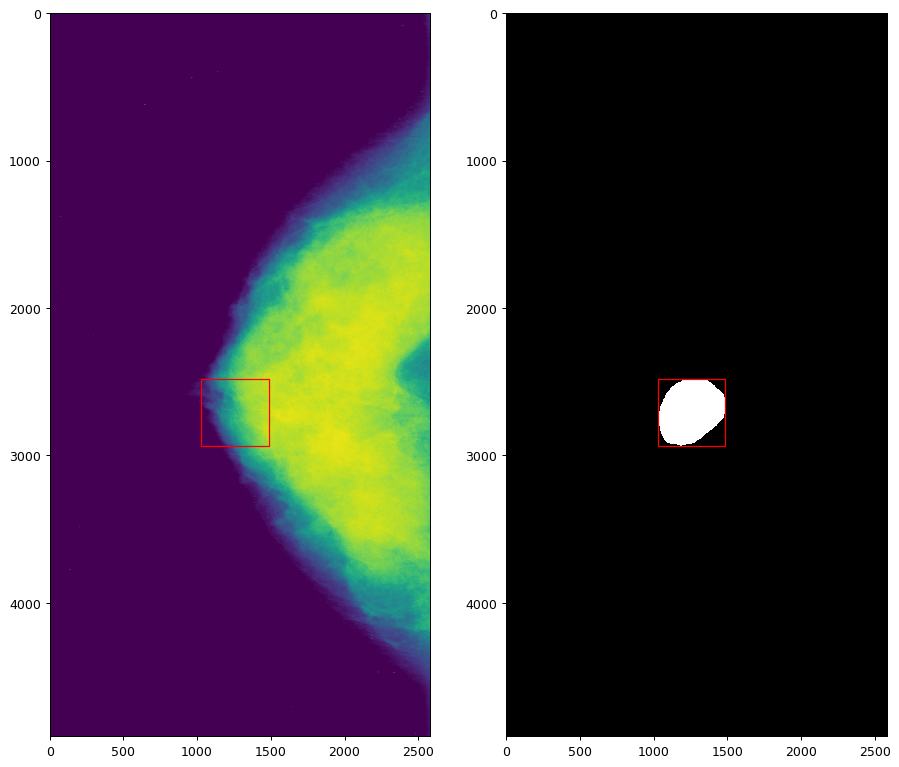

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  12.243979930877686
actual: benign
predicted: malignant


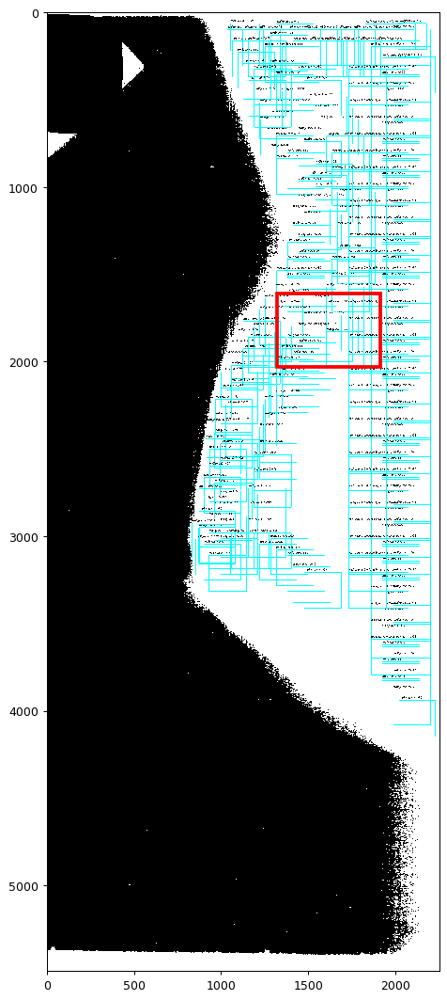

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


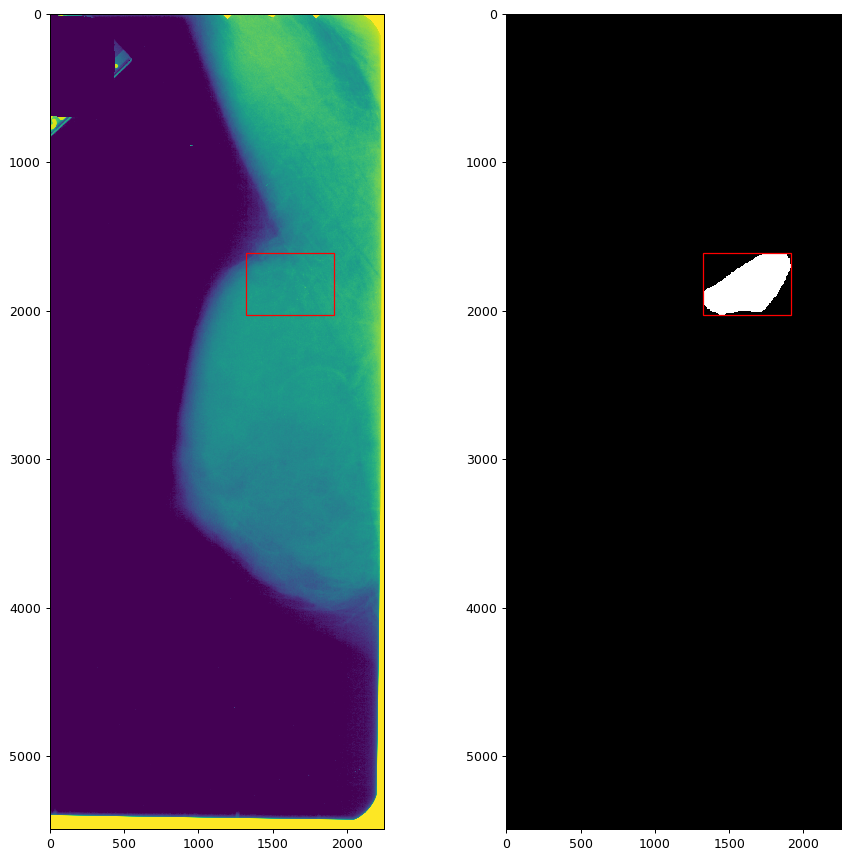

processing time:  24.818417072296143
actual: benign
predicted: malignant


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


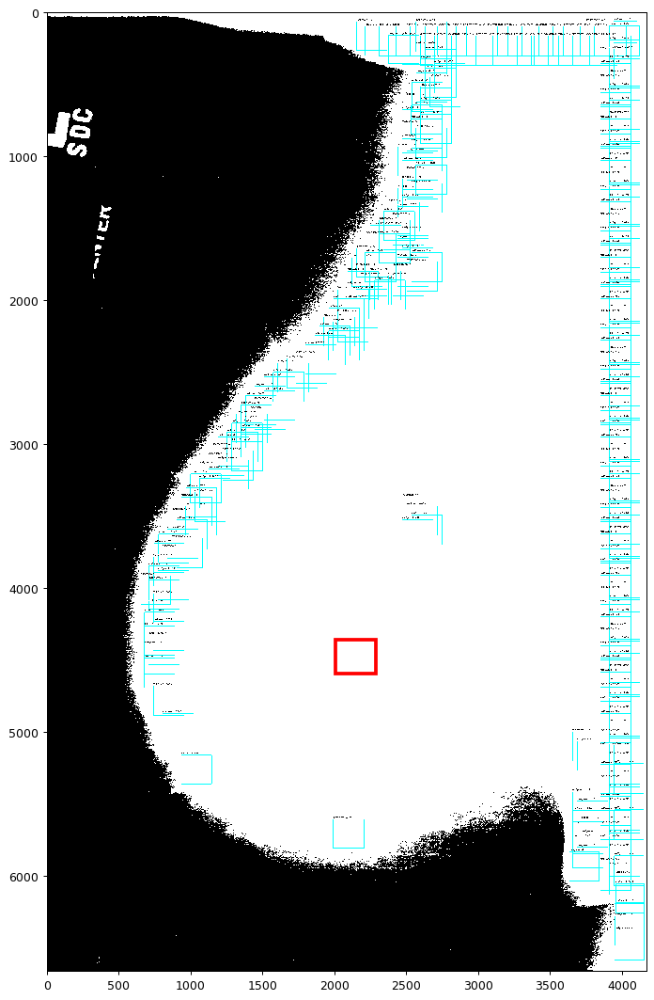

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


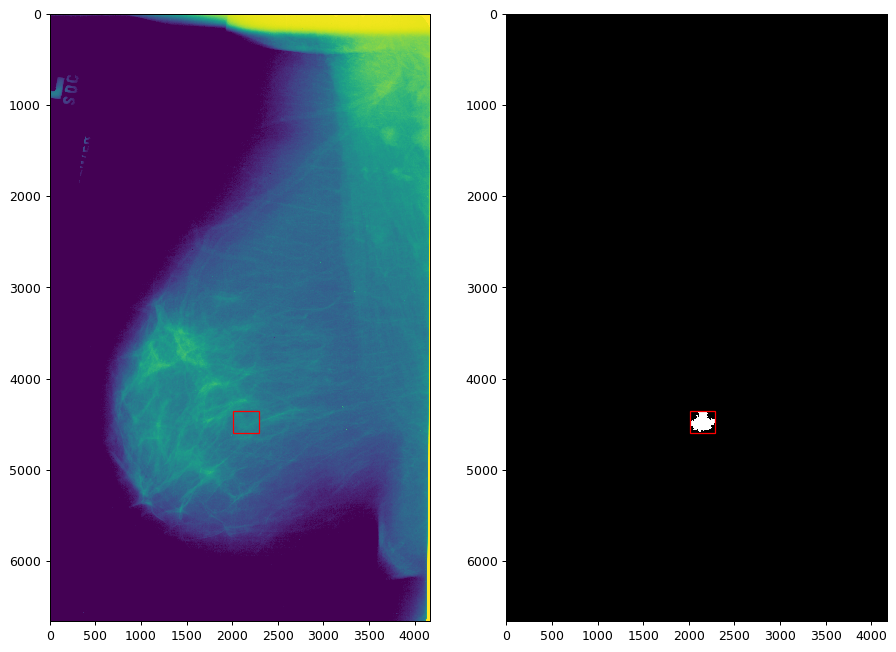

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  14.699506998062134
actual: benign
predicted: malignant


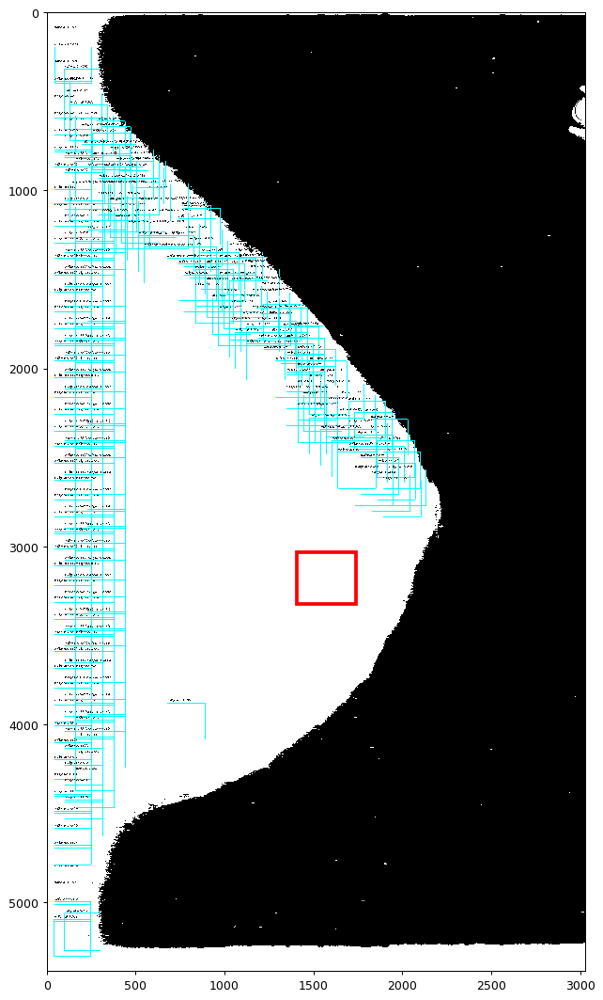

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


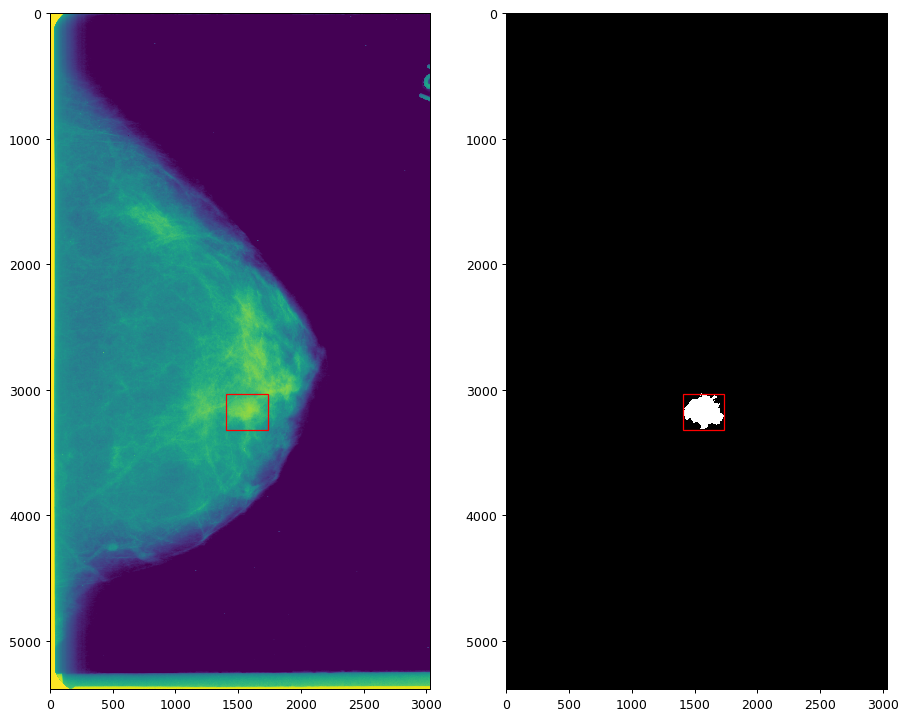

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  13.6475830078125
actual: malignant
predicted: malignant


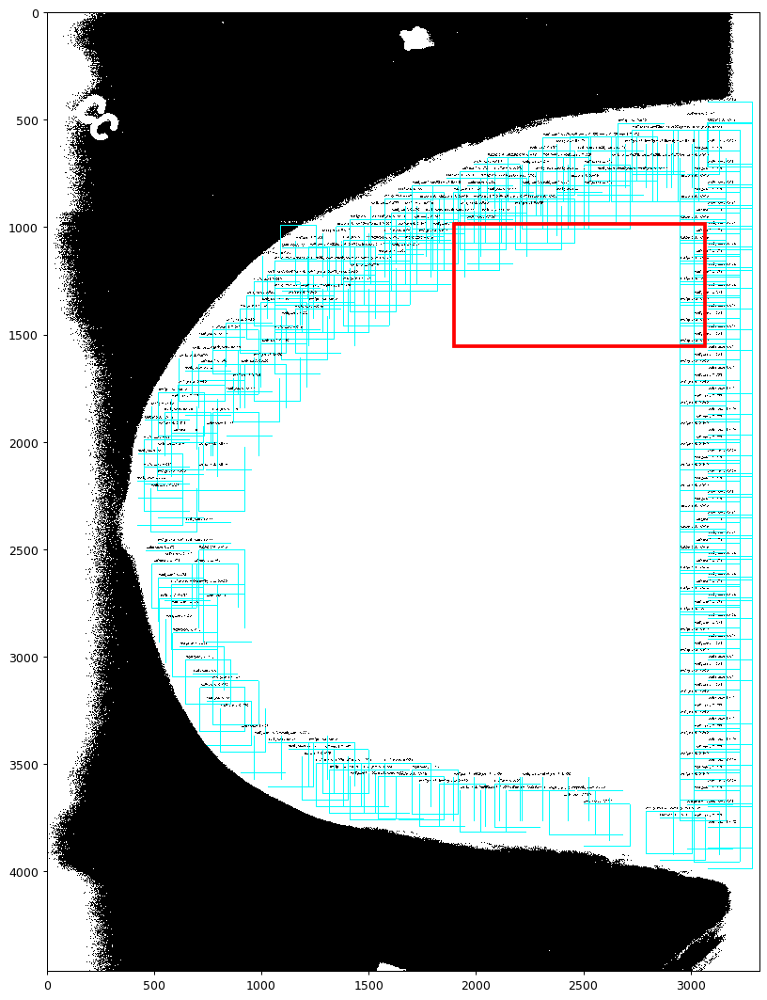

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


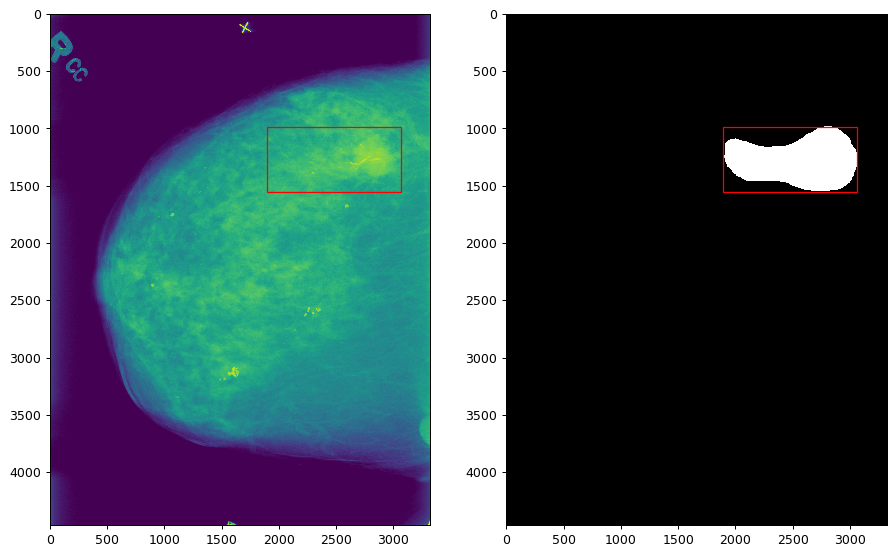

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  19.77029275894165
actual: benign
predicted: malignant


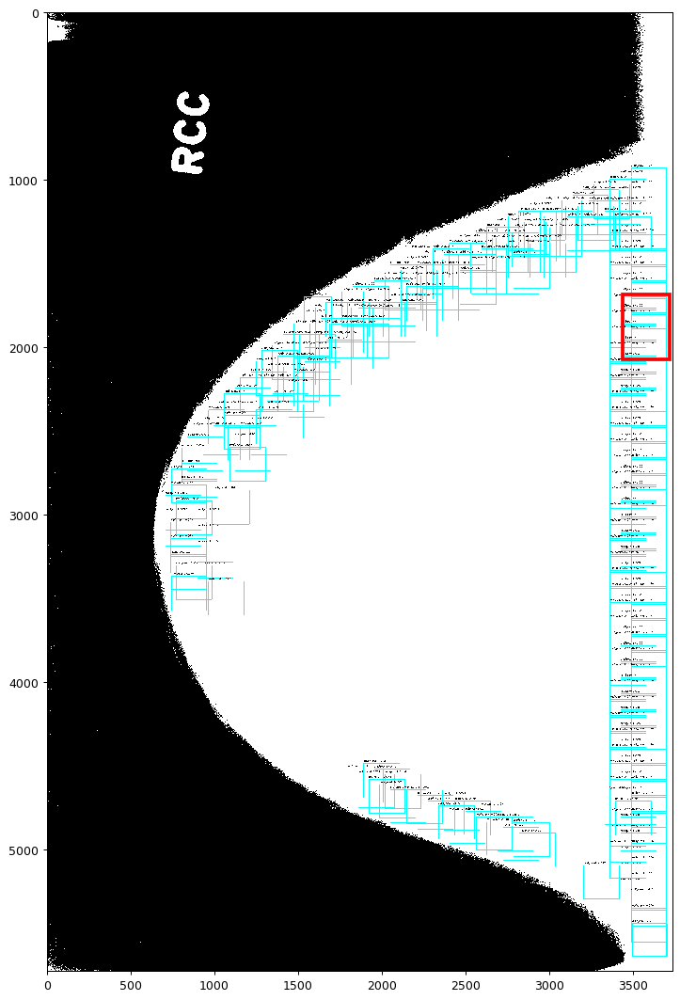

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


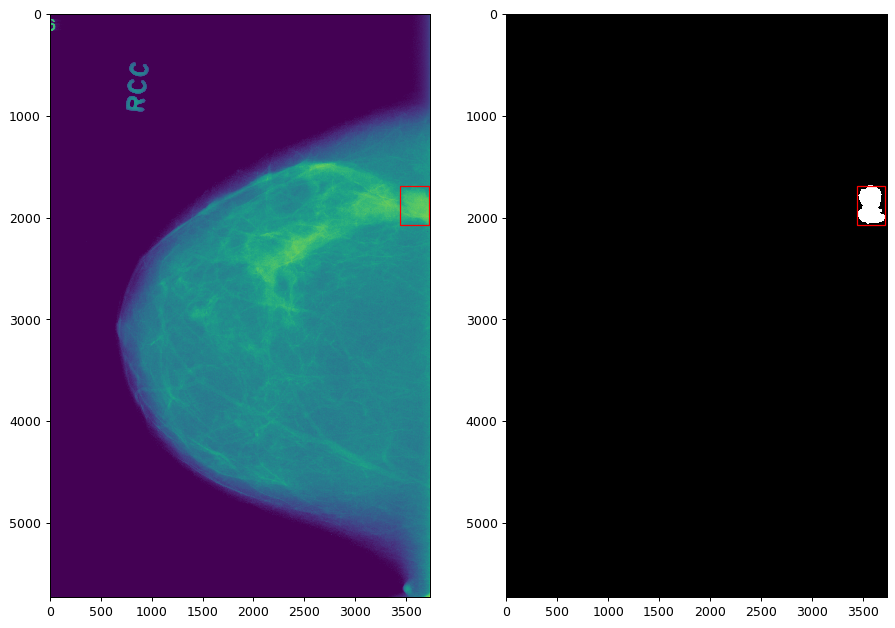

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  12.97911286354065
actual: benign
predicted: malignant


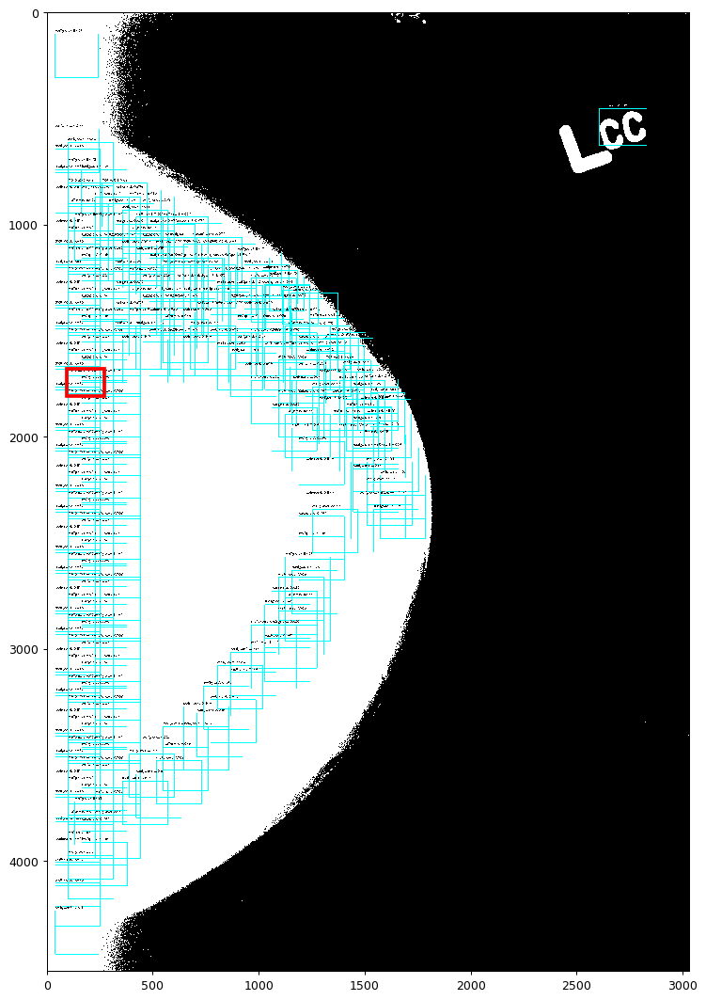

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


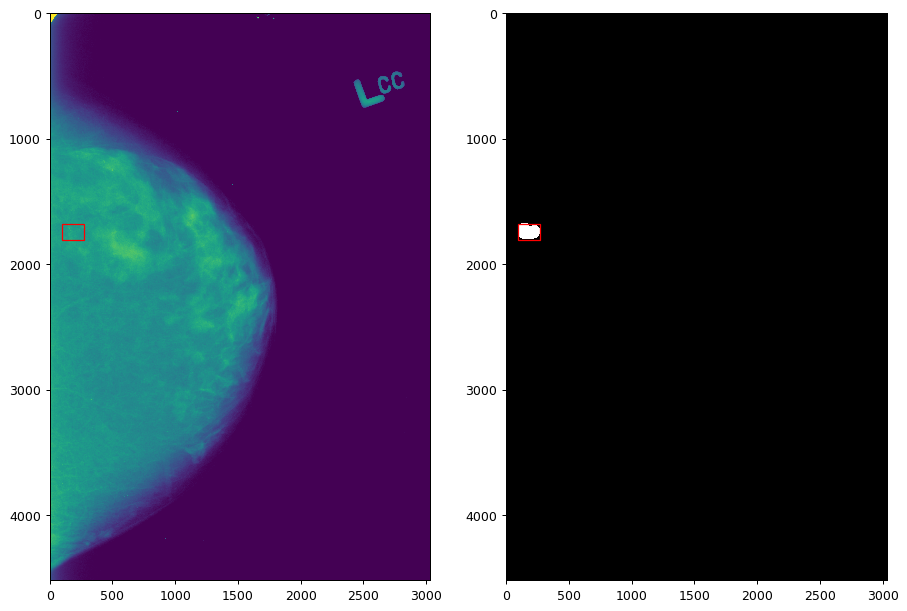

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  13.01469087600708
actual: malignant
predicted: malignant


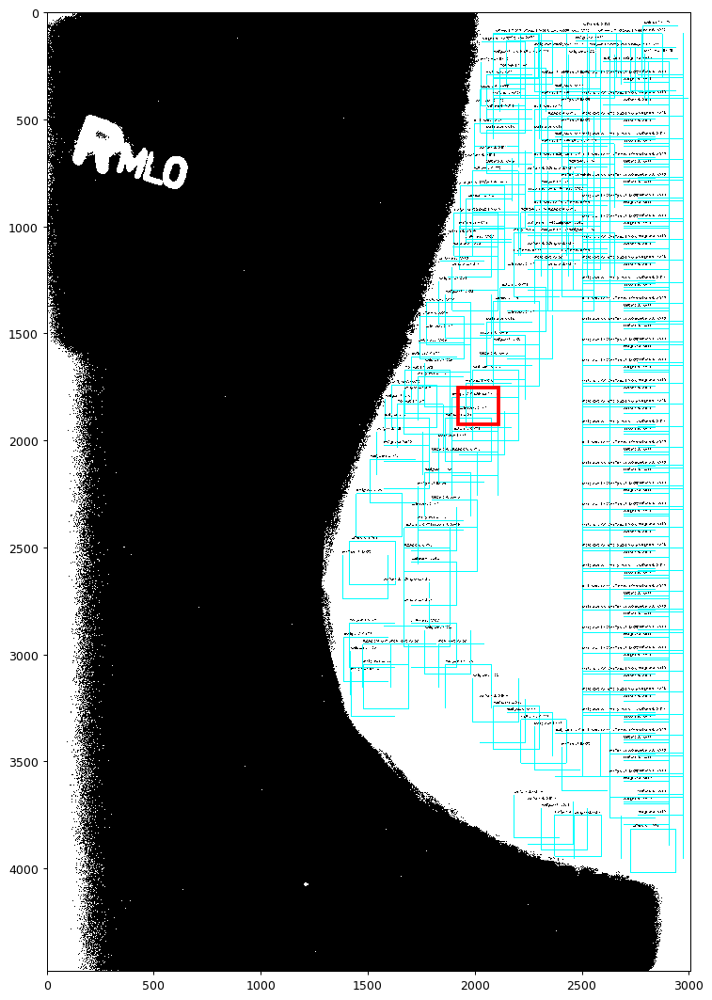

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


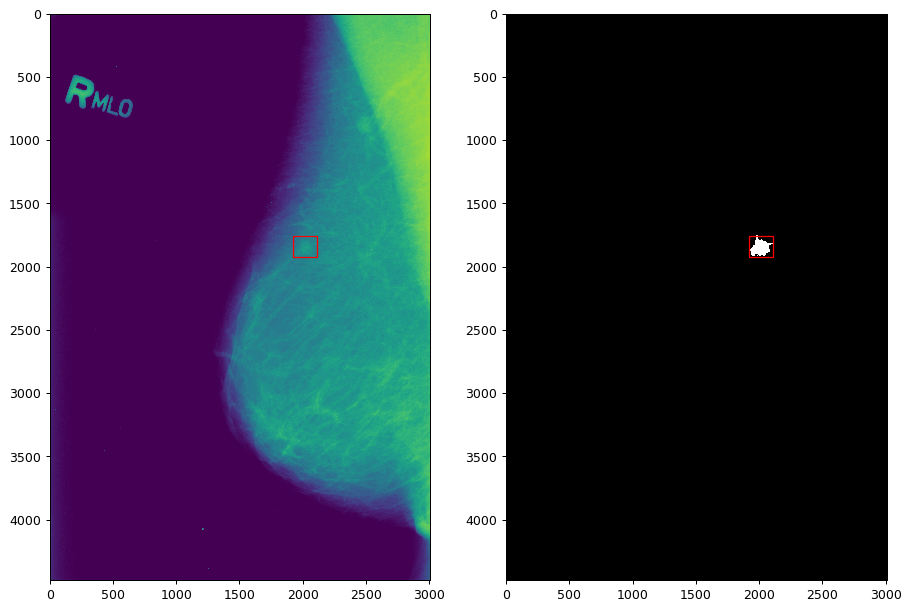

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  13.359768867492676
actual: benign
predicted: malignant


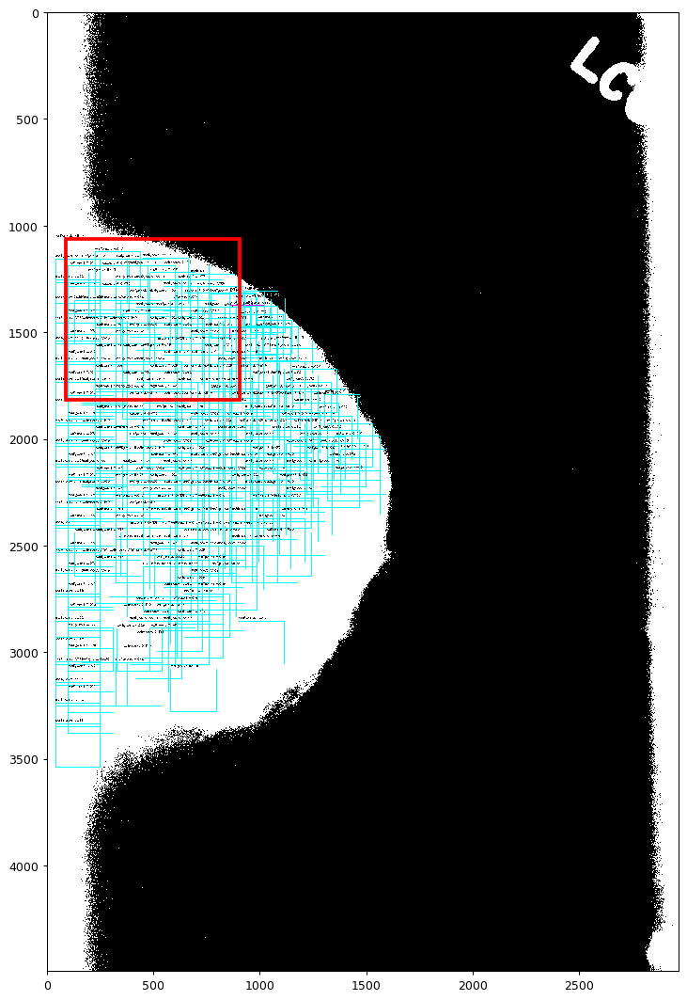

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


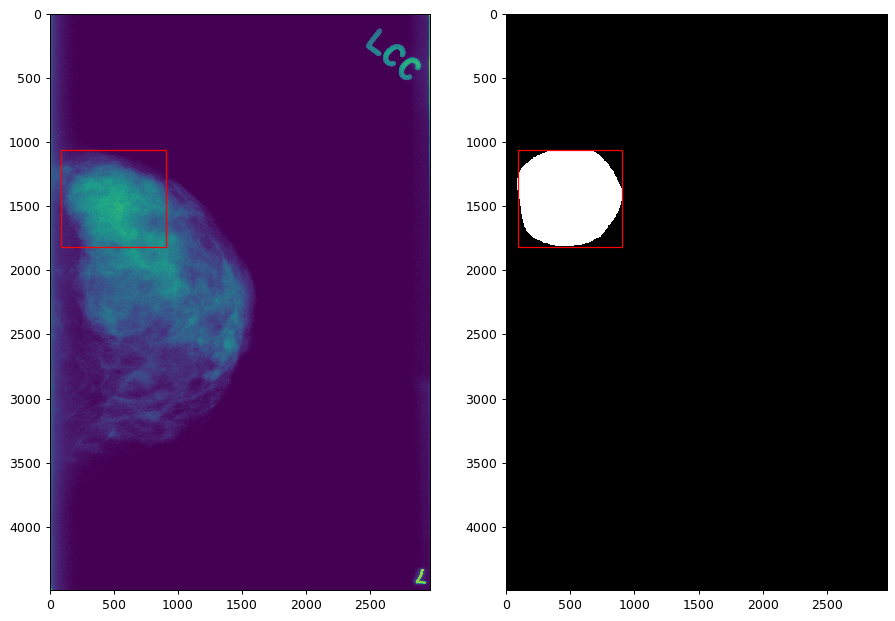

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  12.657927989959717
actual: malignant
predicted: malignant


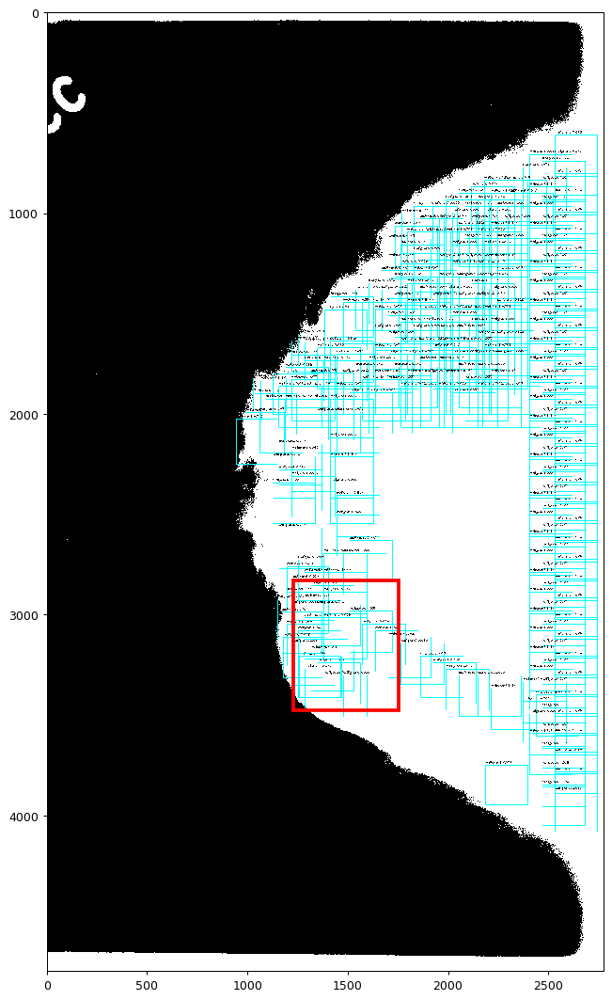

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


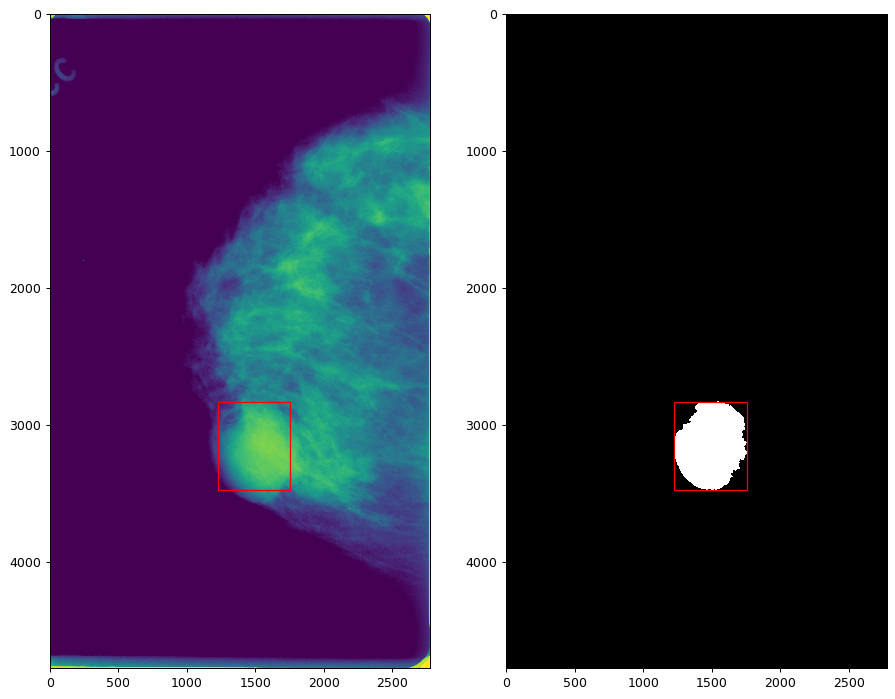

processing time:  21.716371774673462
actual: malignant
predicted: malignant


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


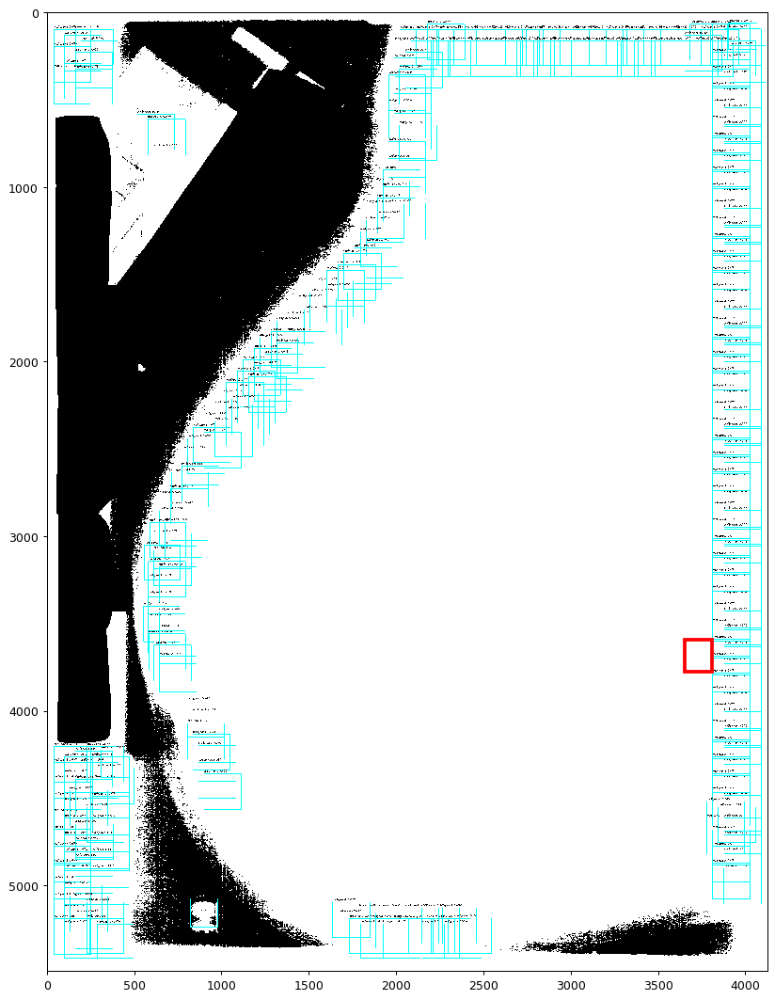

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


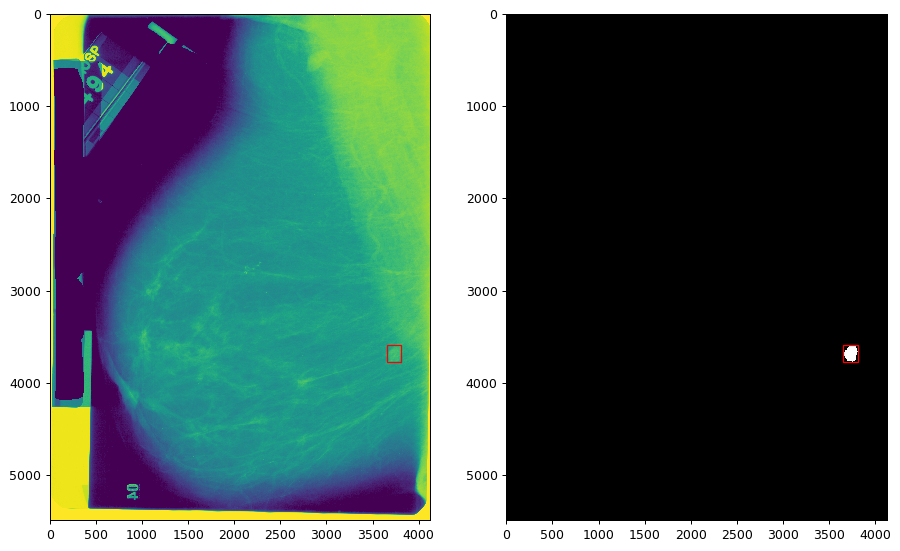

processing time:  25.29153299331665
actual: benign
predicted: malignant


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


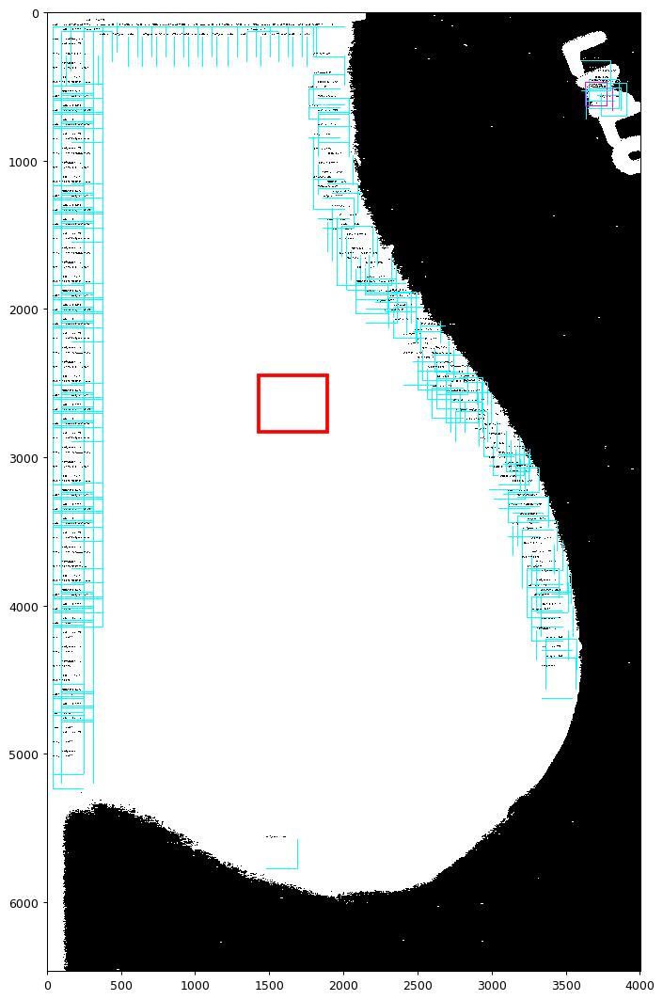

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


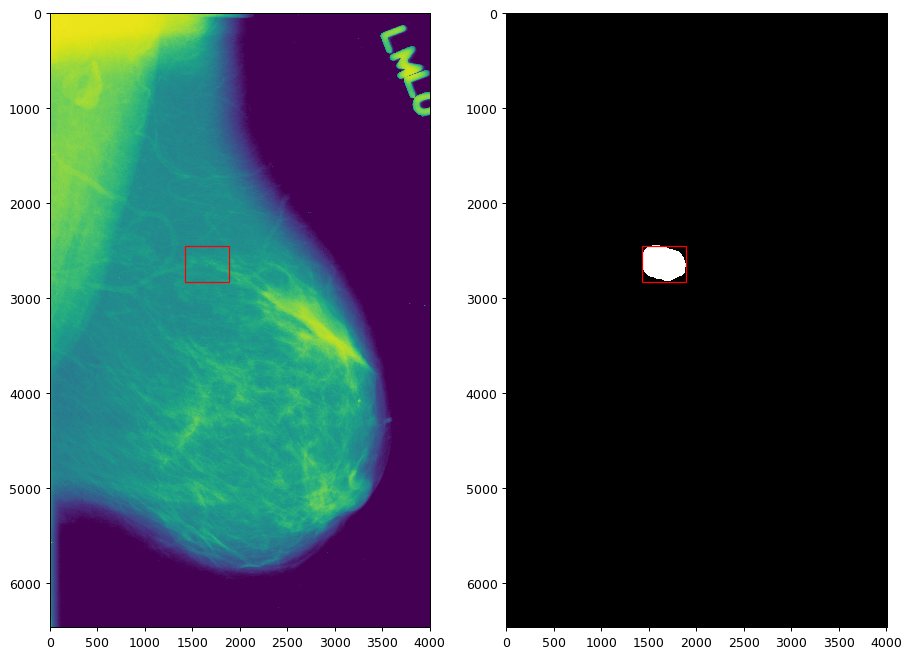

processing time:  22.38895893096924
actual: benign
predicted: malignant


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


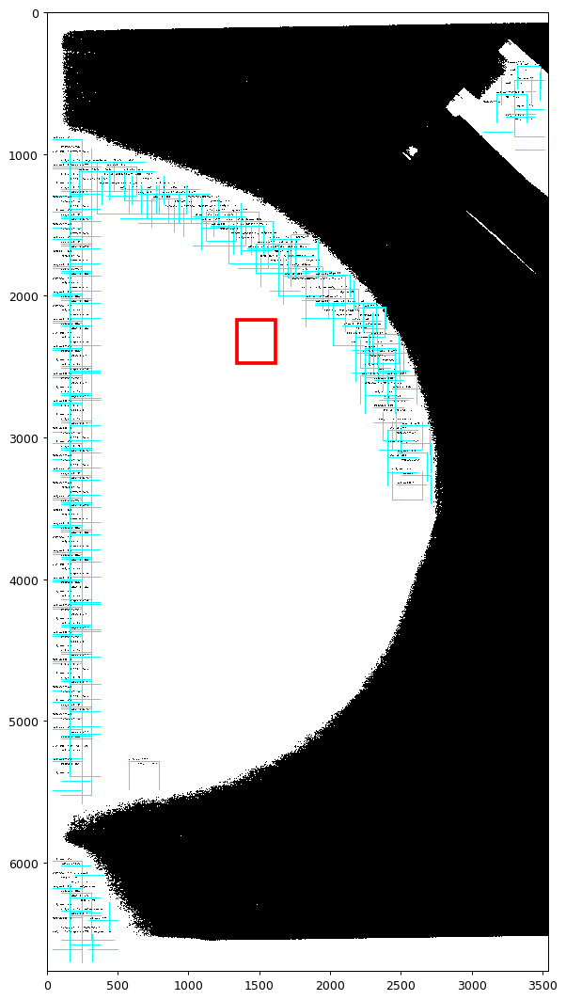

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


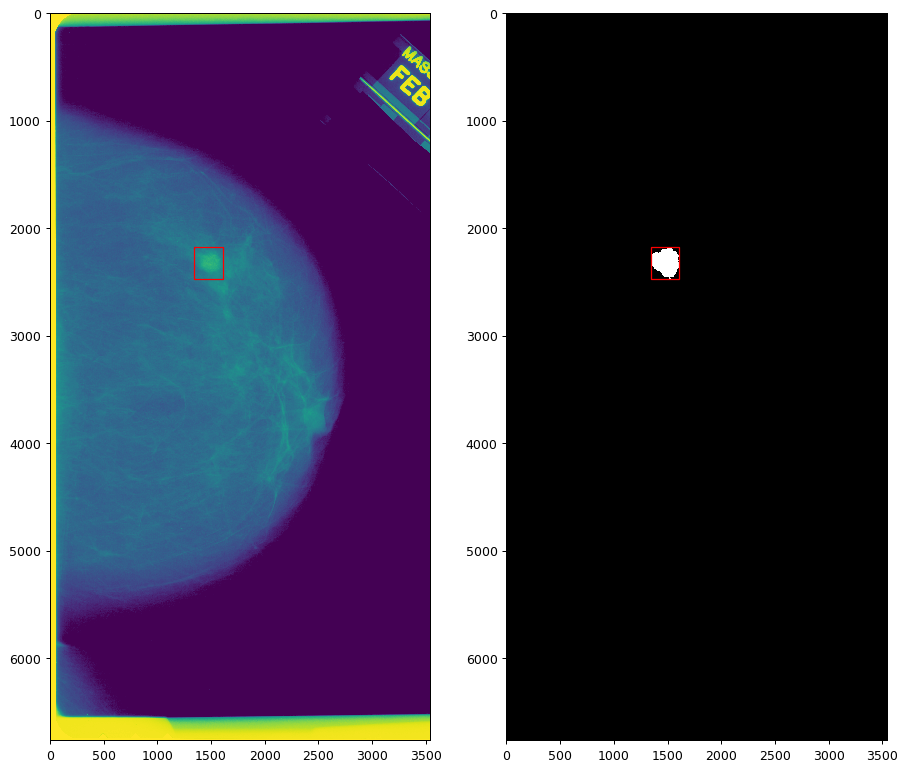

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  13.360060214996338
actual: benign
predicted: malignant


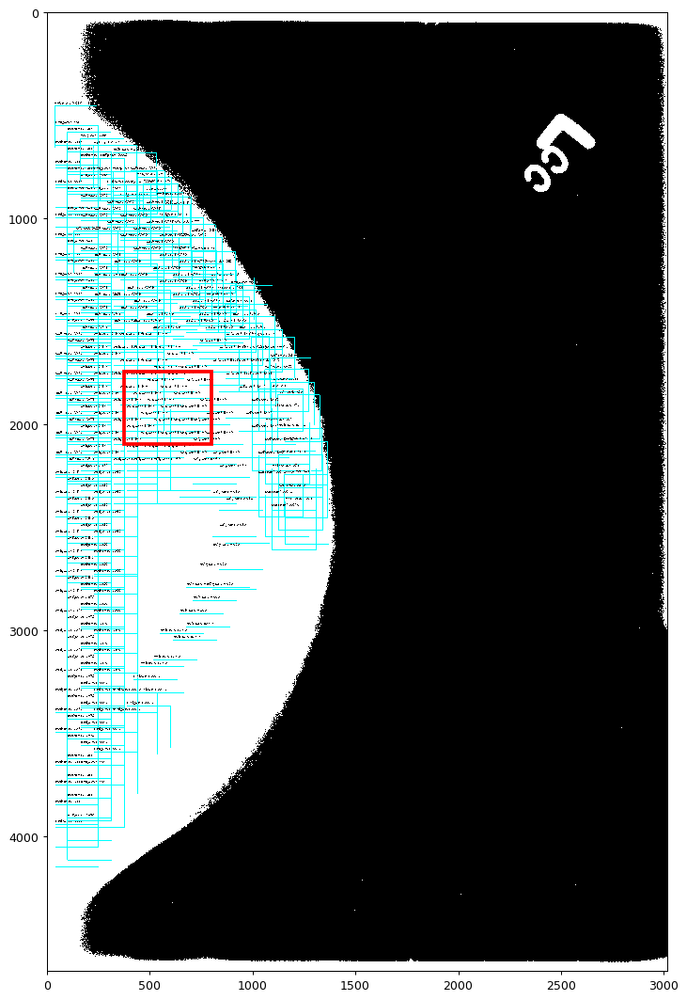

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


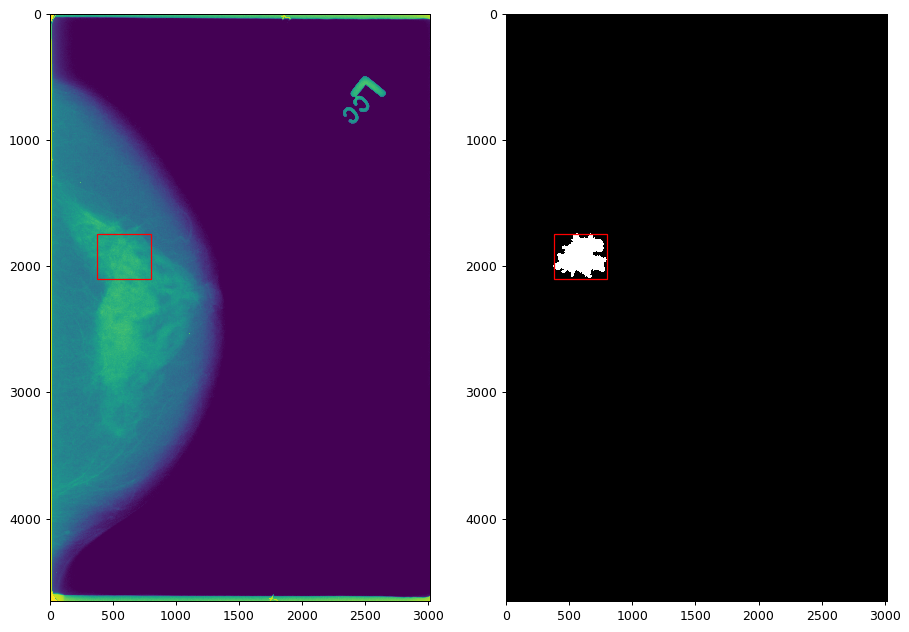

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  12.838568925857544
actual: benign
predicted: malignant


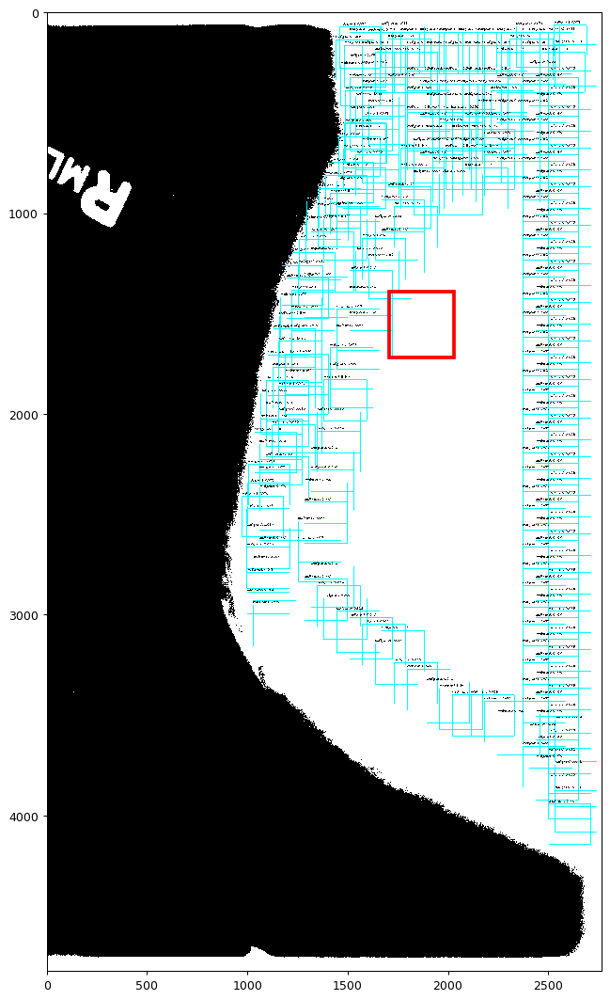

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


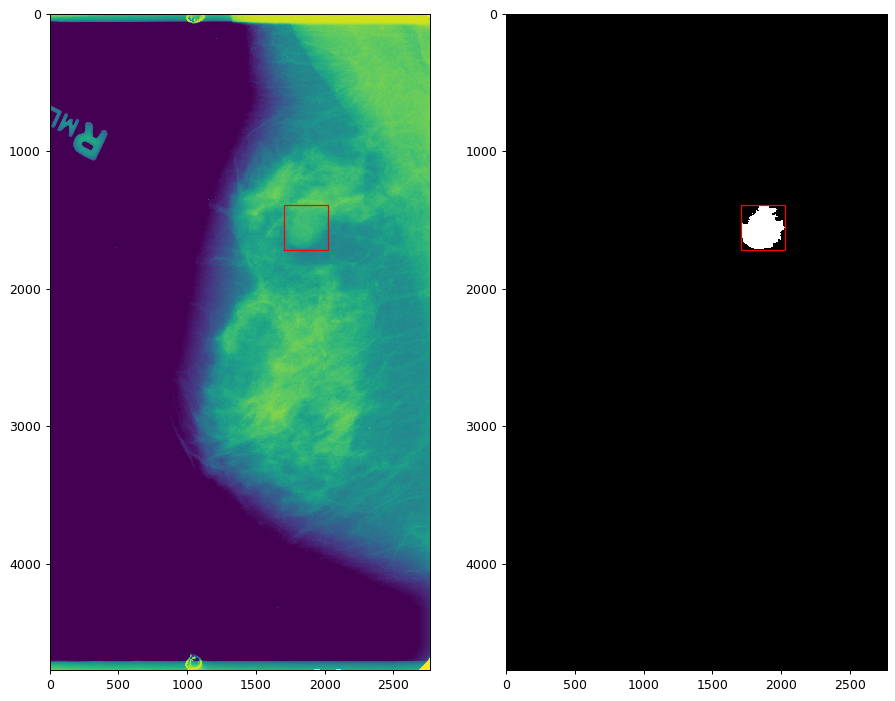

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  13.412008047103882
actual: benign
predicted: malignant


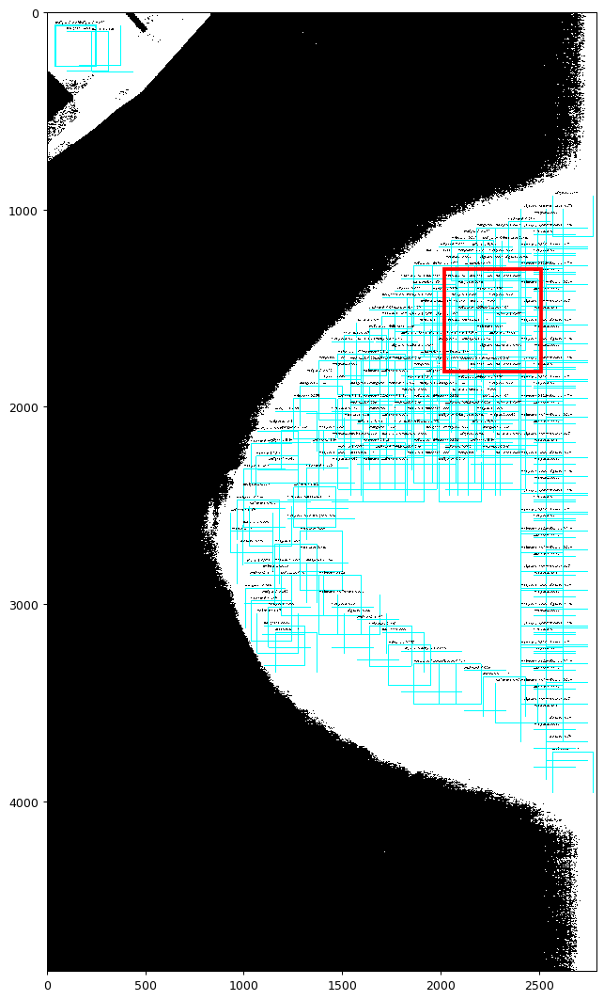

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


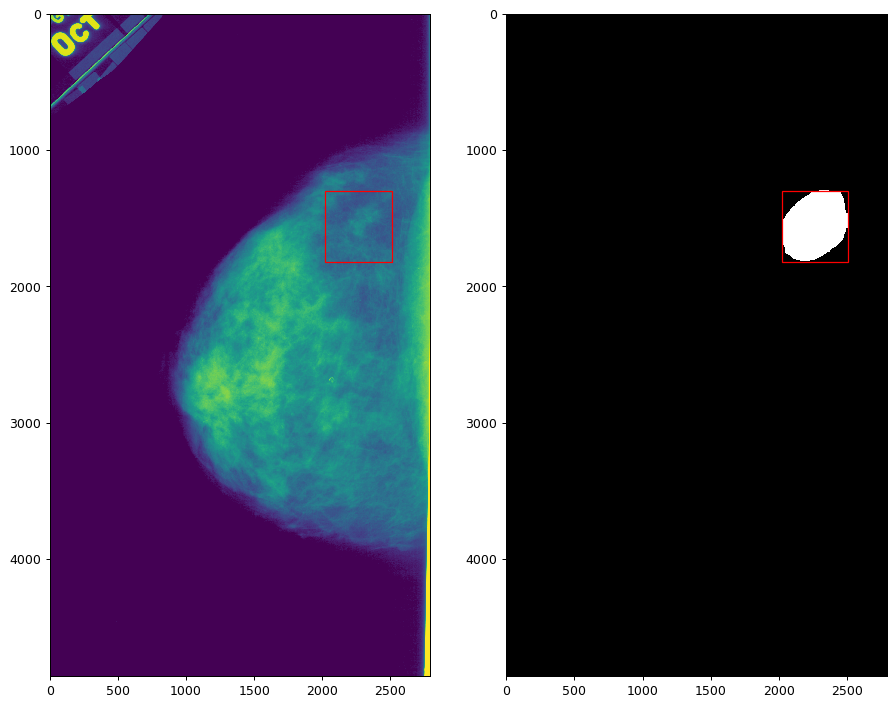

processing time:  22.91987681388855
actual: benign
predicted: malignant


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


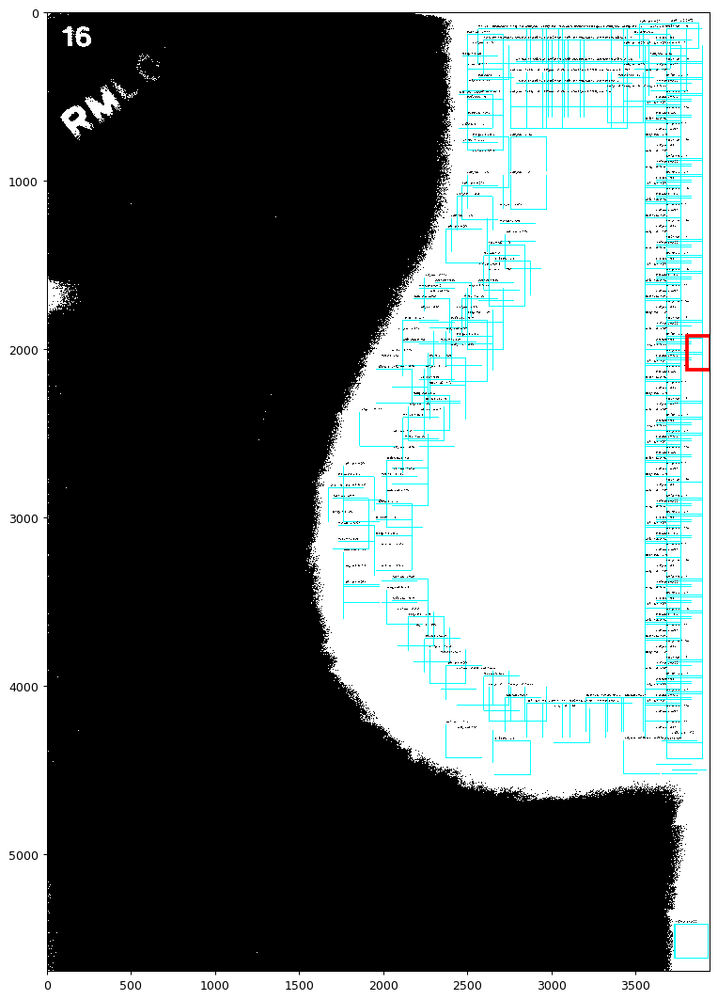

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


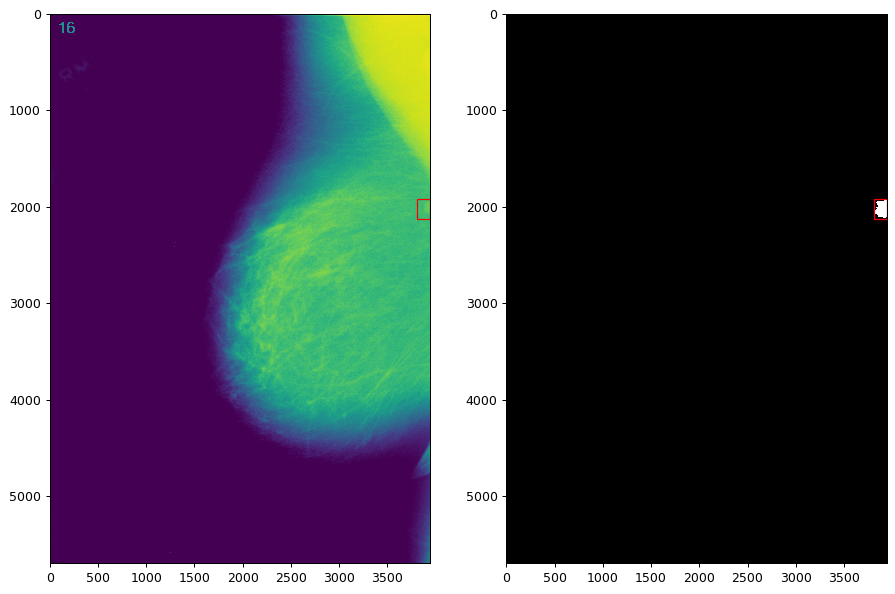

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  12.365699291229248
actual: benign
predicted: malignant


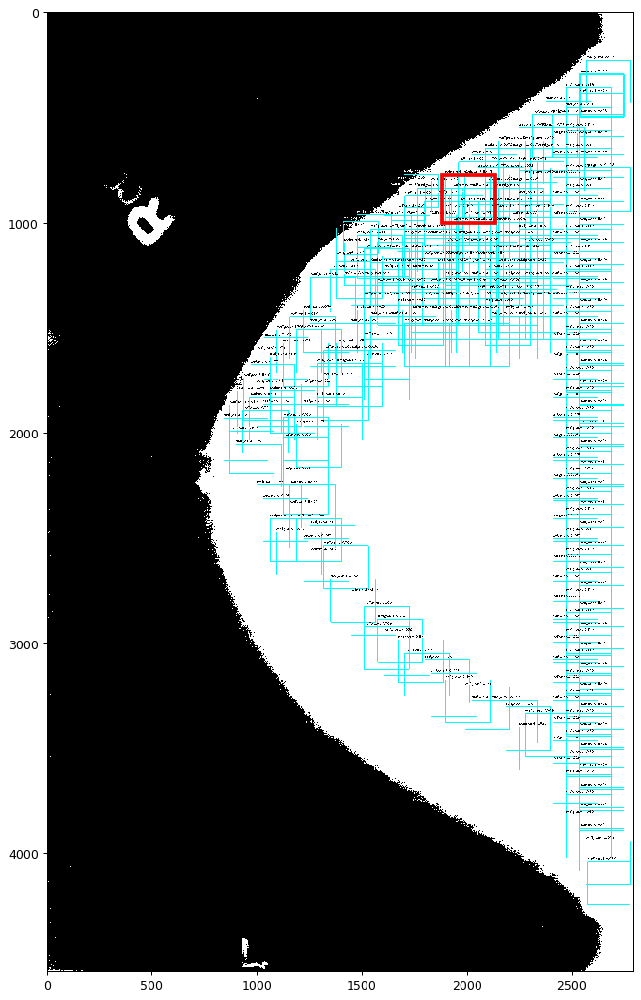

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


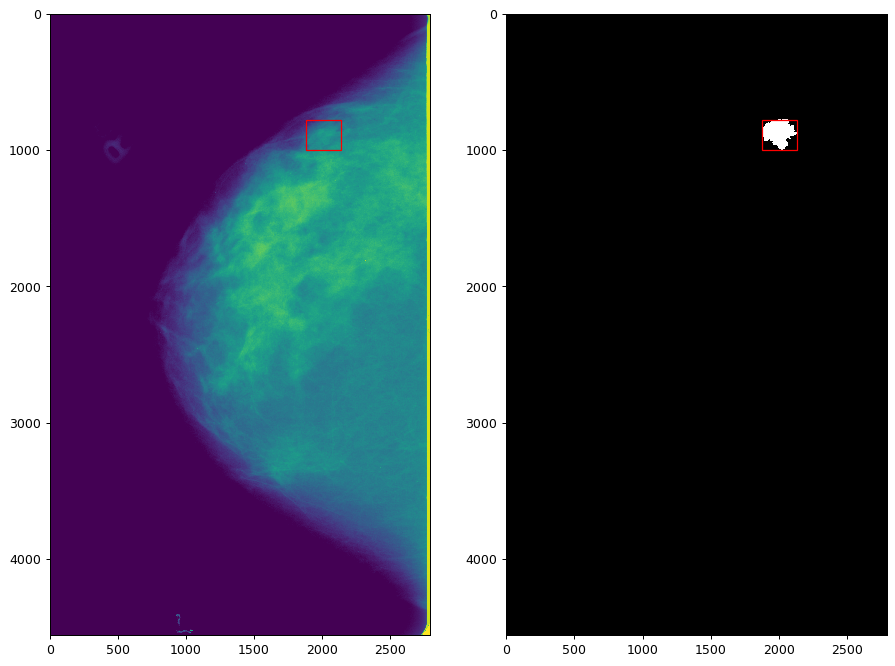

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  15.095752000808716
actual: benign
predicted: malignant


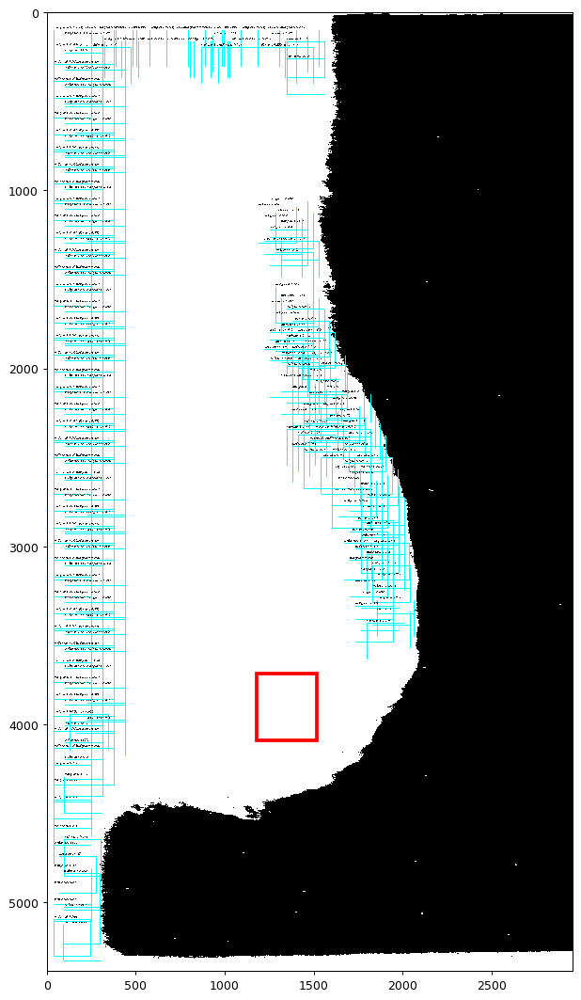

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


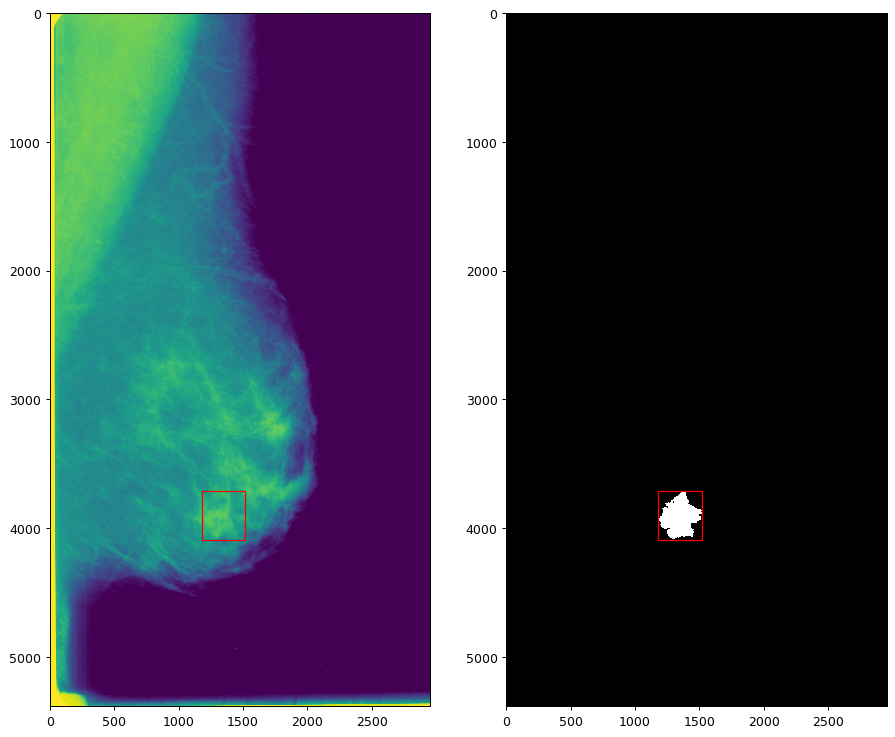

processing time:  21.118062019348145
actual: malignant
predicted: malignant


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


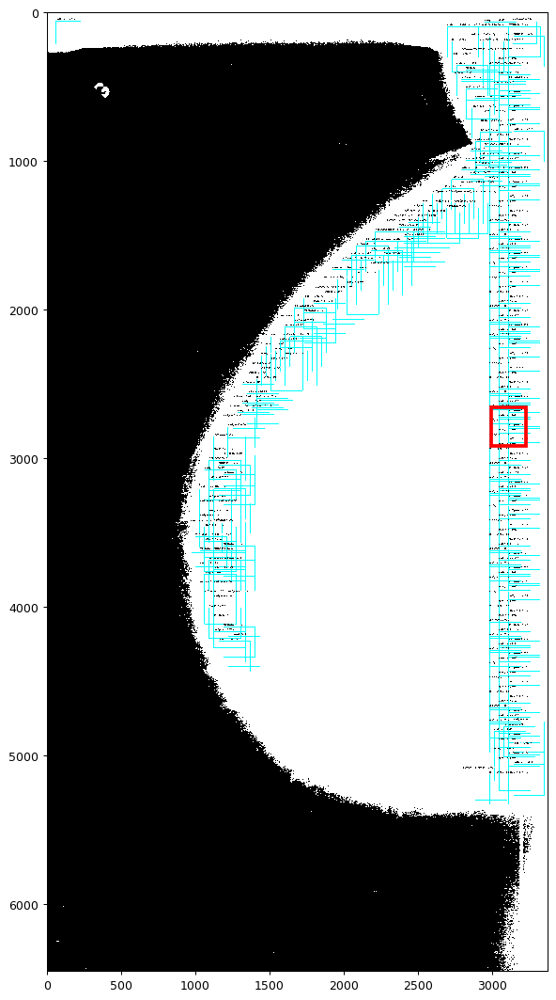

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


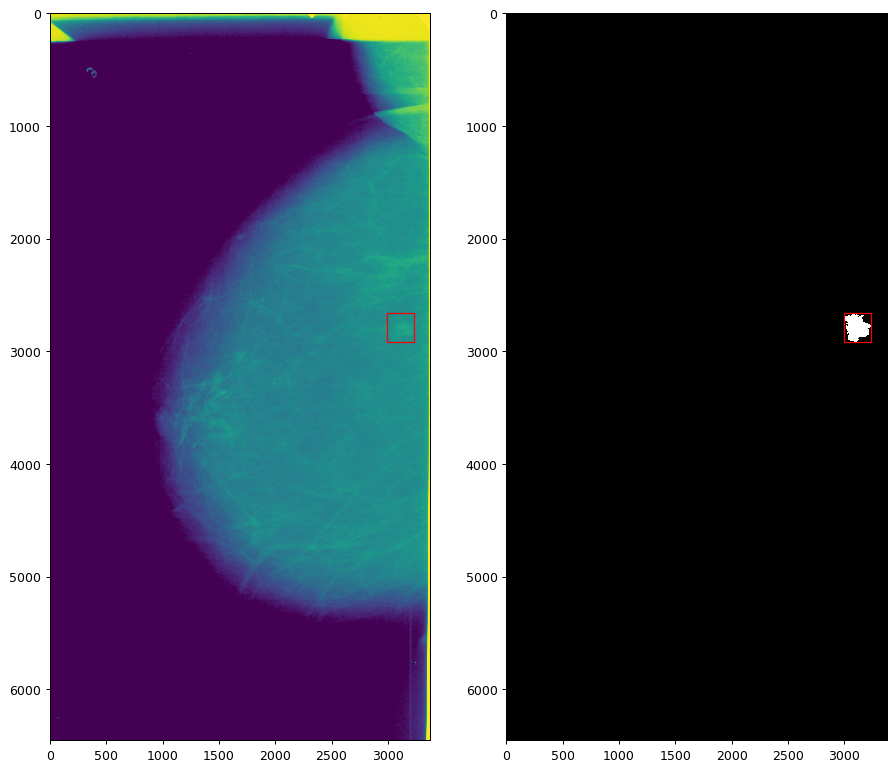

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  11.610601902008057
actual: malignant
predicted: malignant


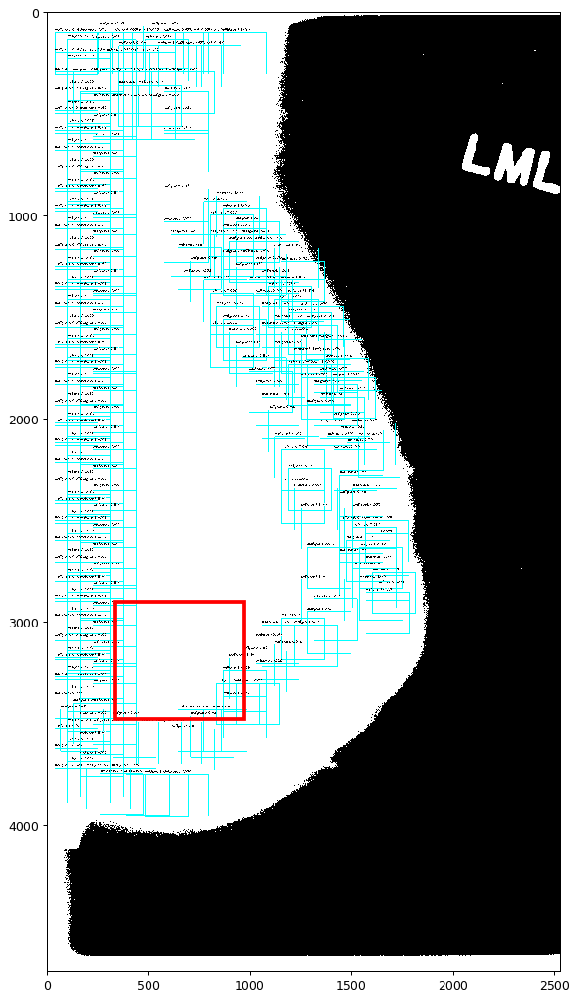

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


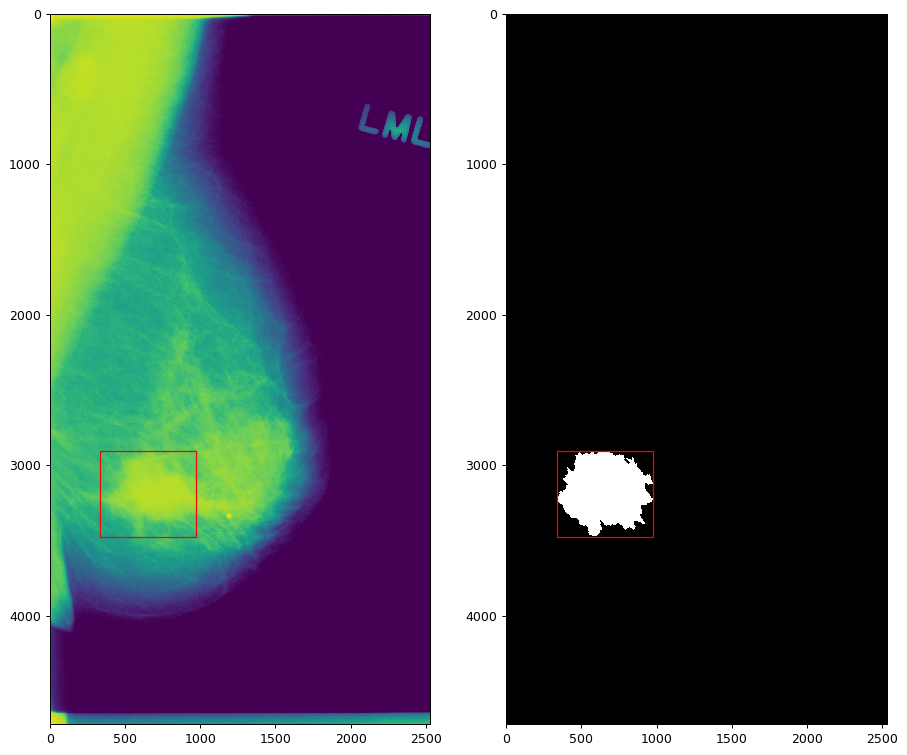

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  12.906370878219604
actual: benign
predicted: malignant


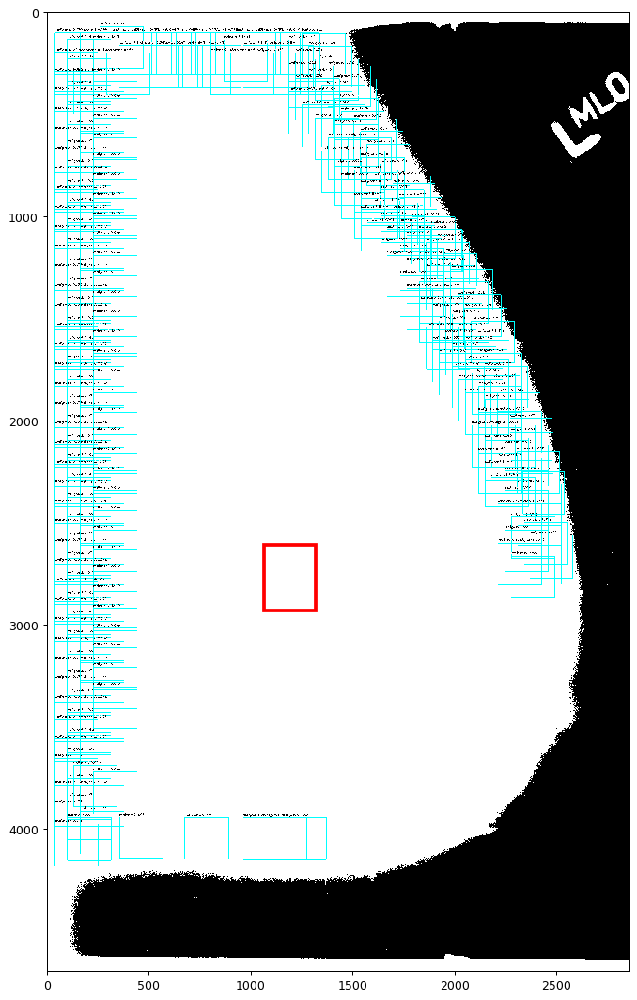

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


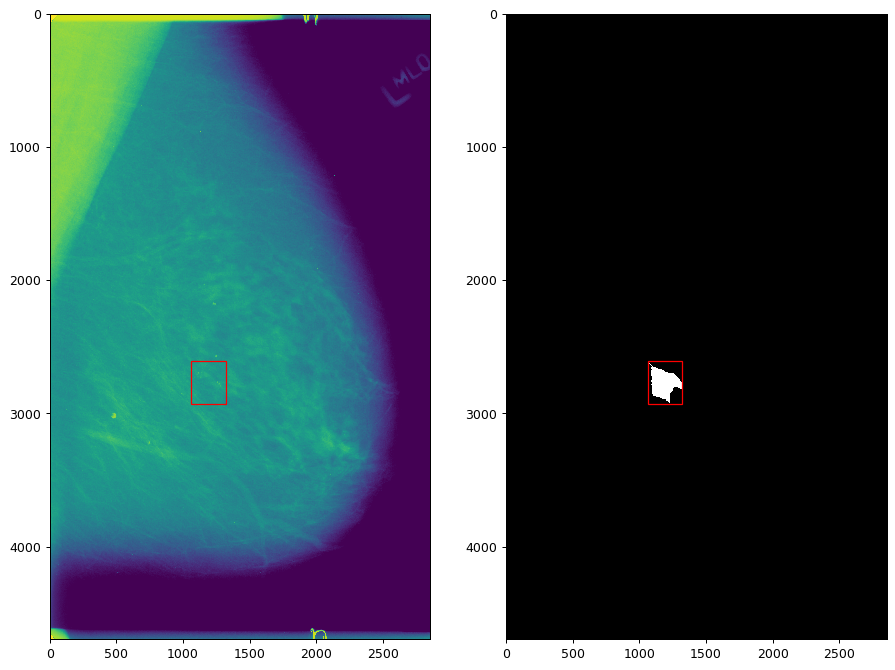

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  14.091001272201538
actual: malignant
predicted: malignant


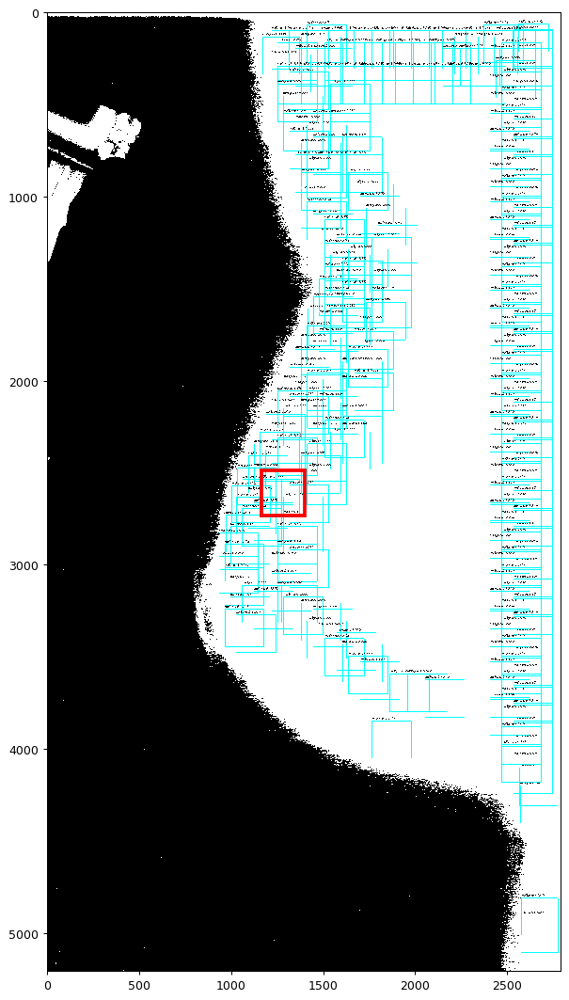

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


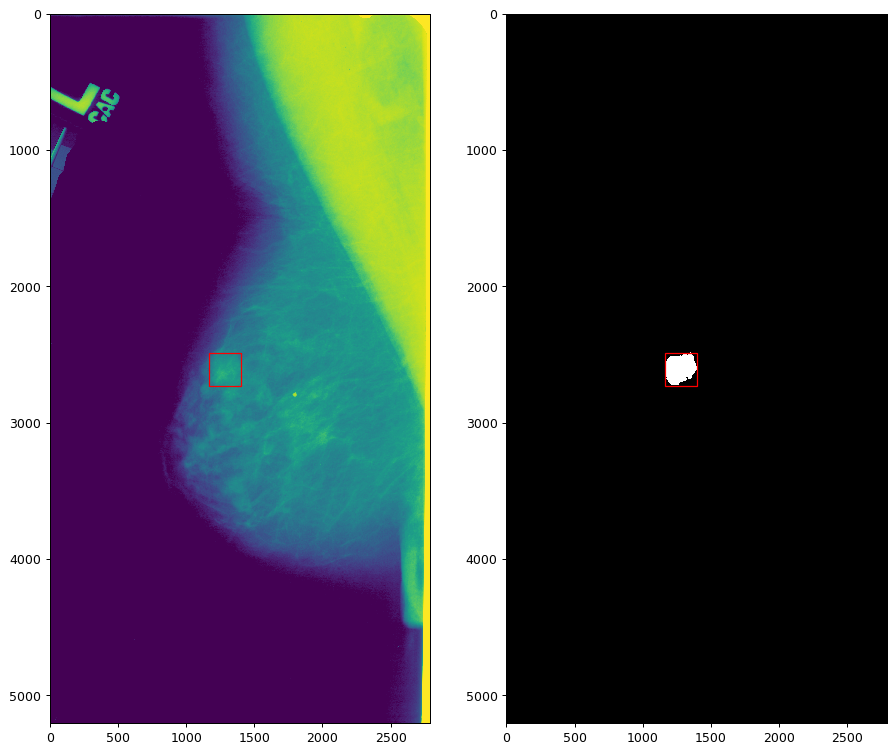

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  13.241513967514038
actual: benign
predicted: malignant


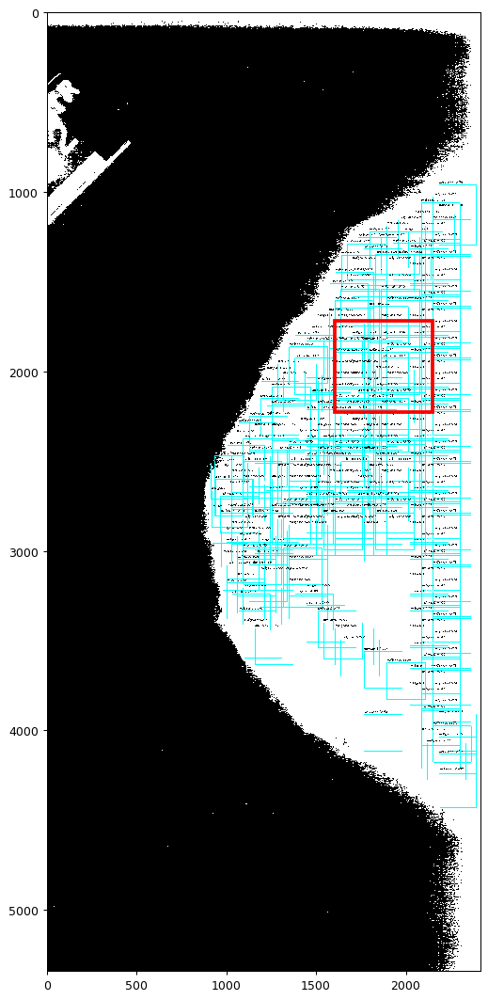

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


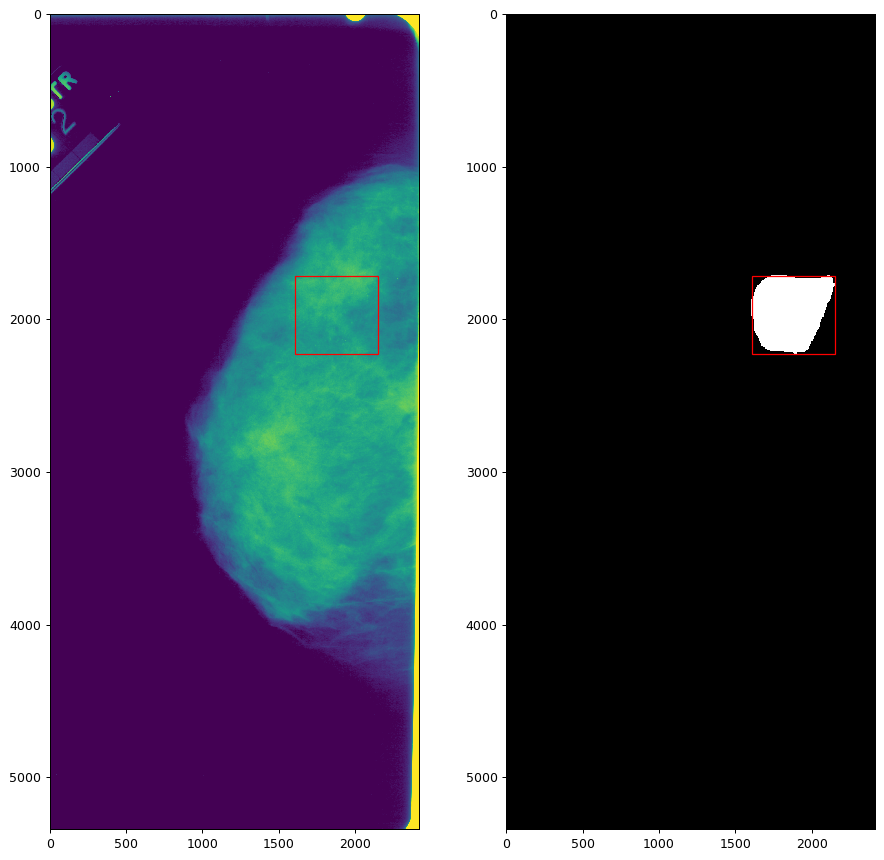

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  18.21753215789795
actual: benign
predicted: malignant


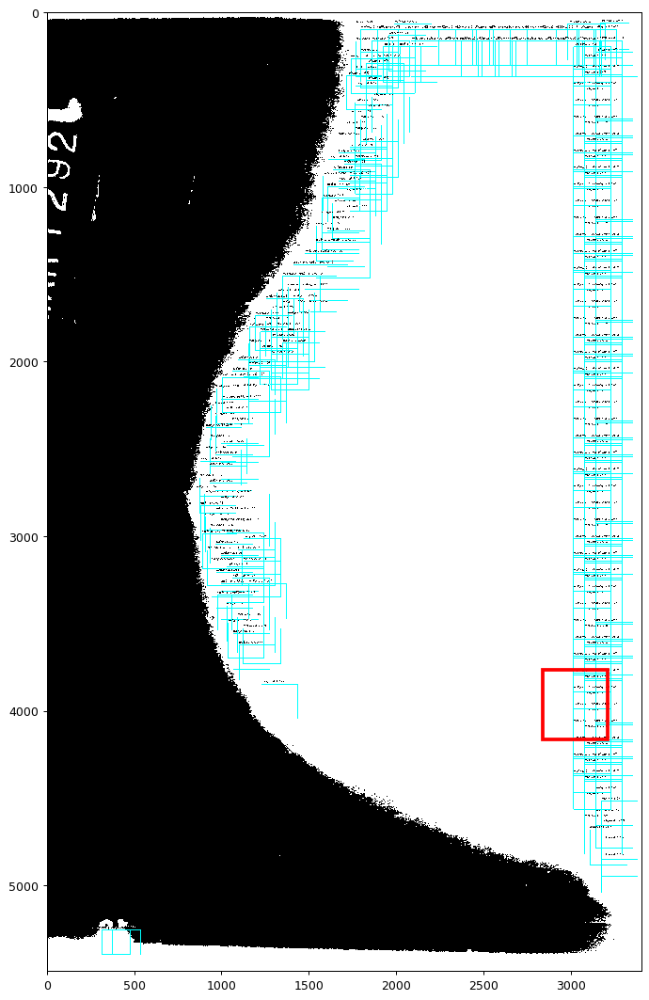

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


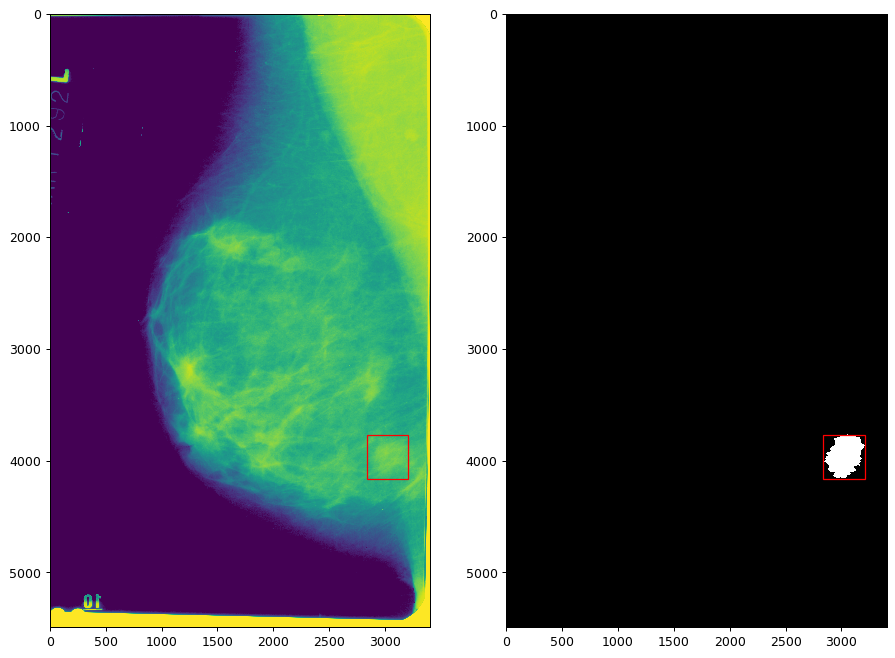

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  13.19736385345459
actual: benign
predicted: malignant


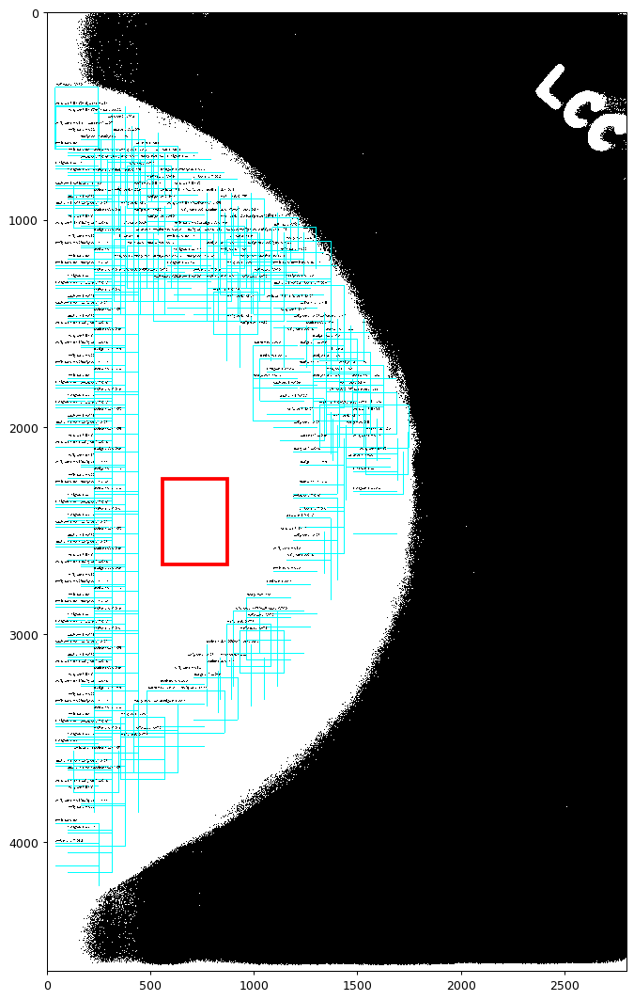

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


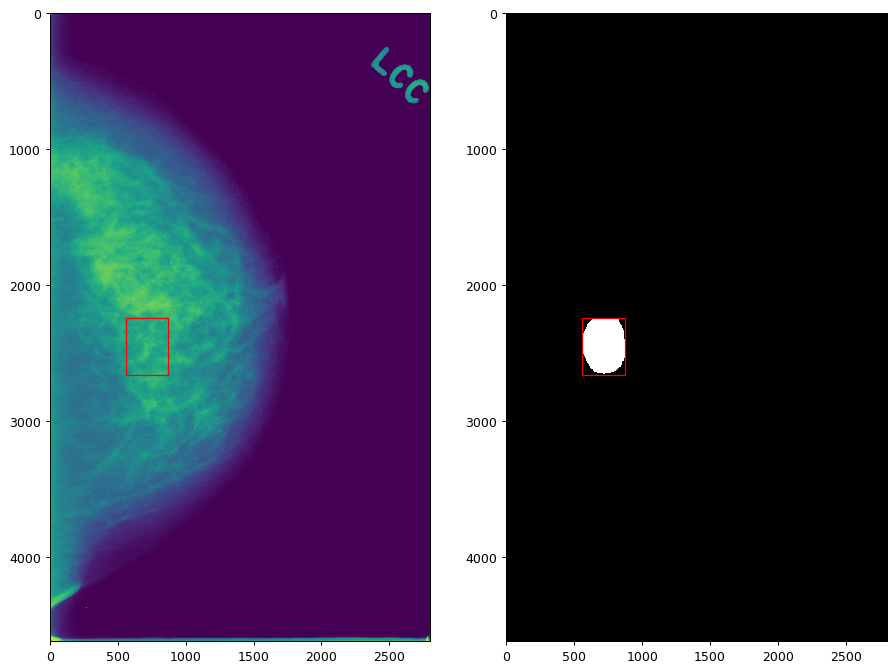

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  20.551647186279297
actual: benign
predicted: malignant


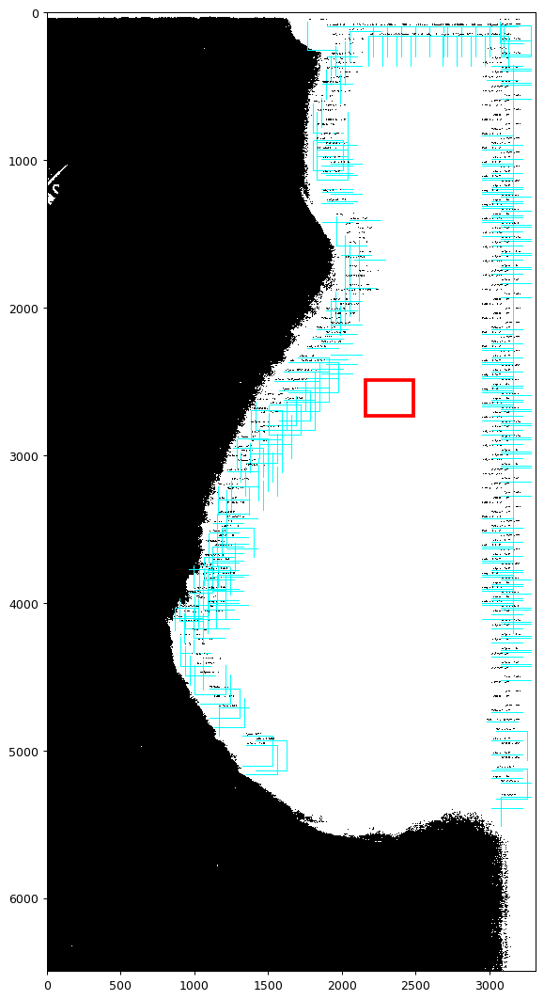

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


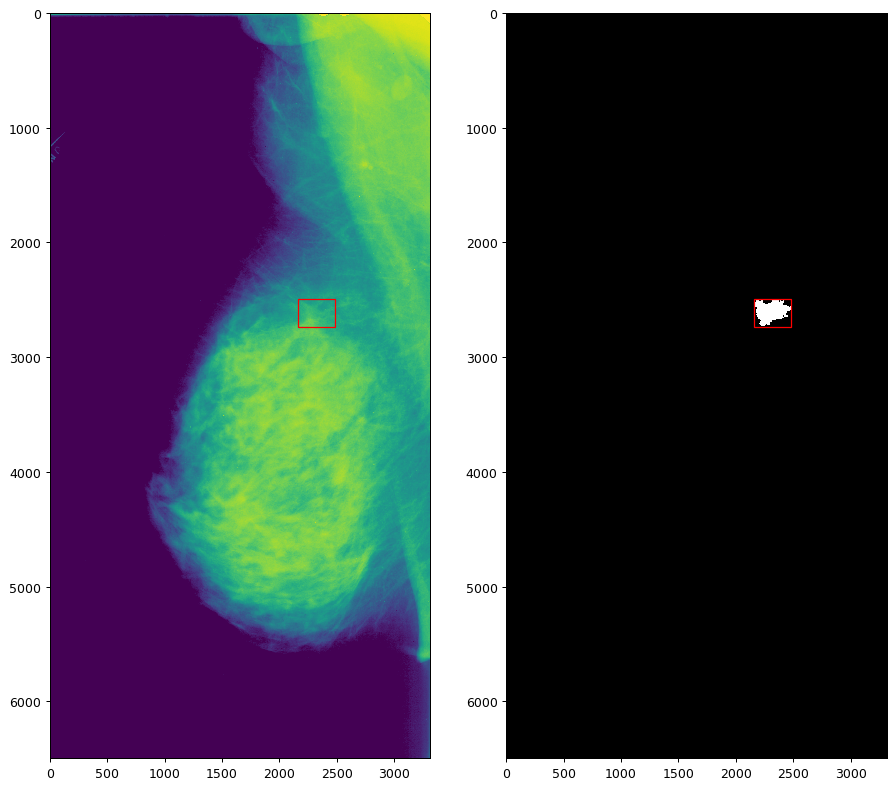

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  14.501495838165283
actual: malignant
predicted: malignant


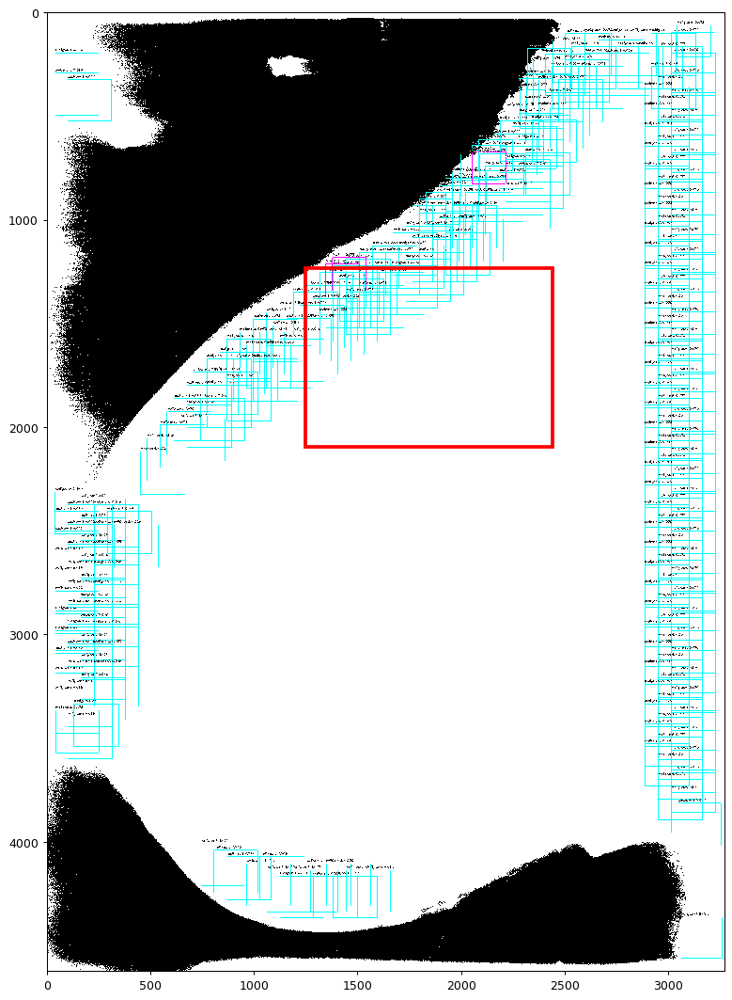

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


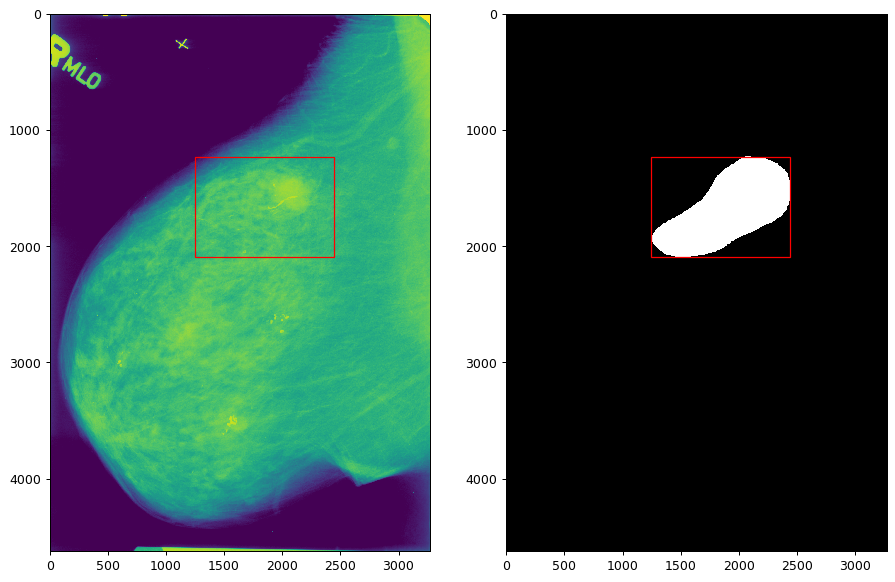

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  15.145020961761475
actual: malignant
predicted: malignant


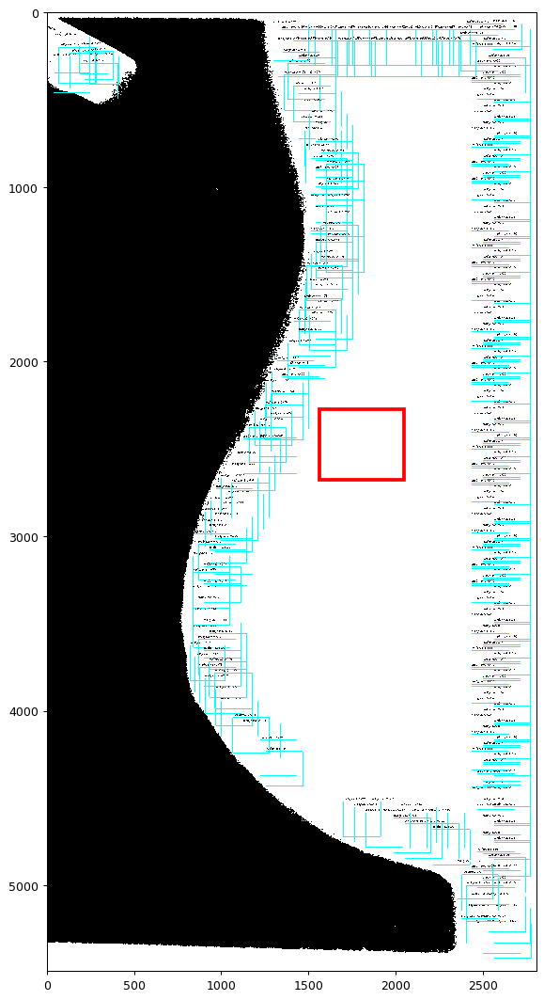

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


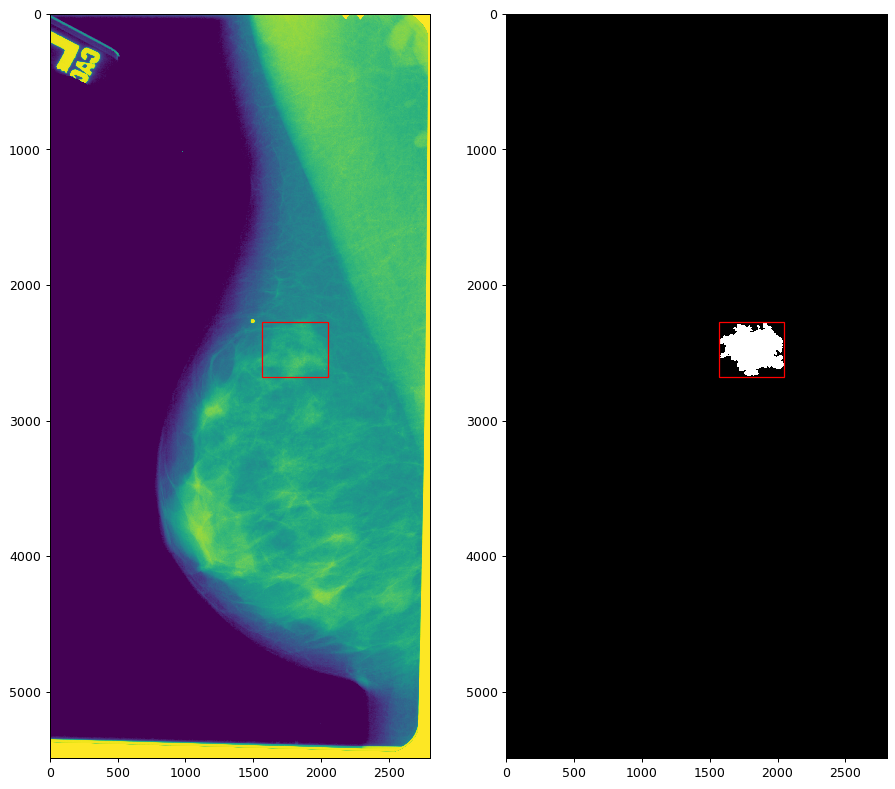

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  14.117518186569214
actual: benign
predicted: malignant


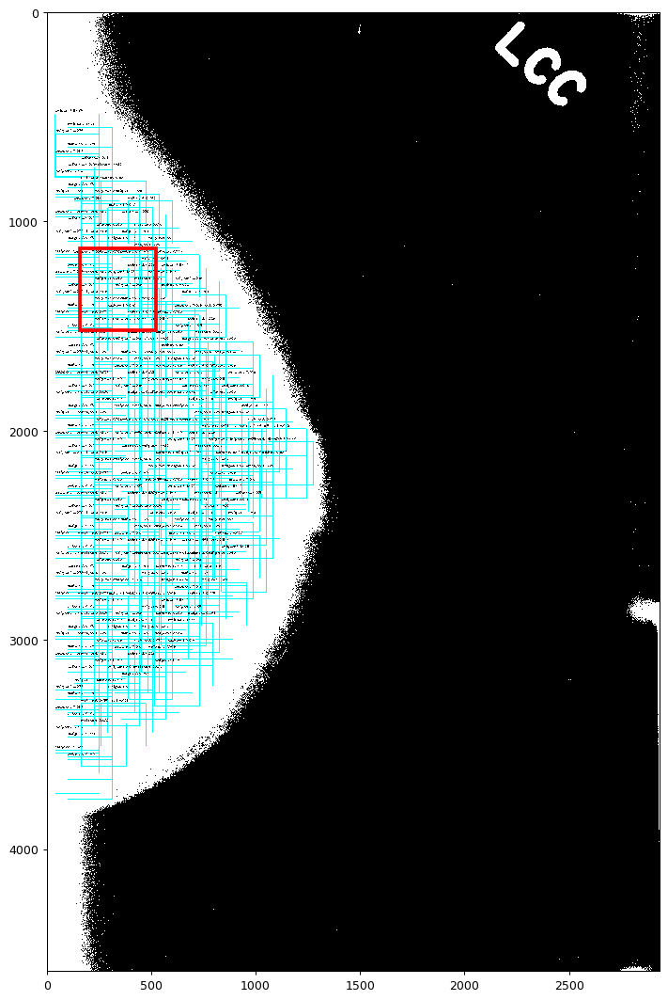

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


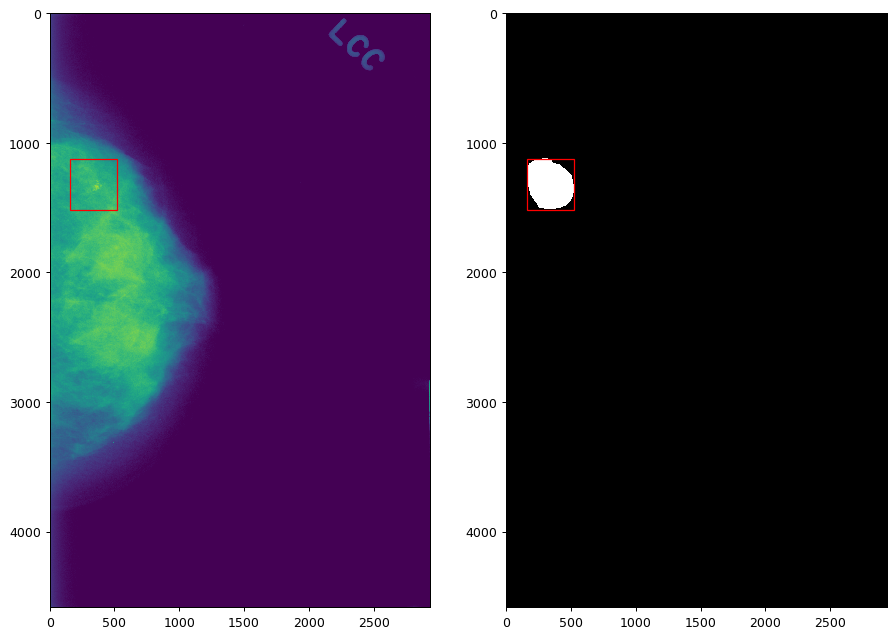

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  12.612064123153687
actual: malignant
predicted: malignant


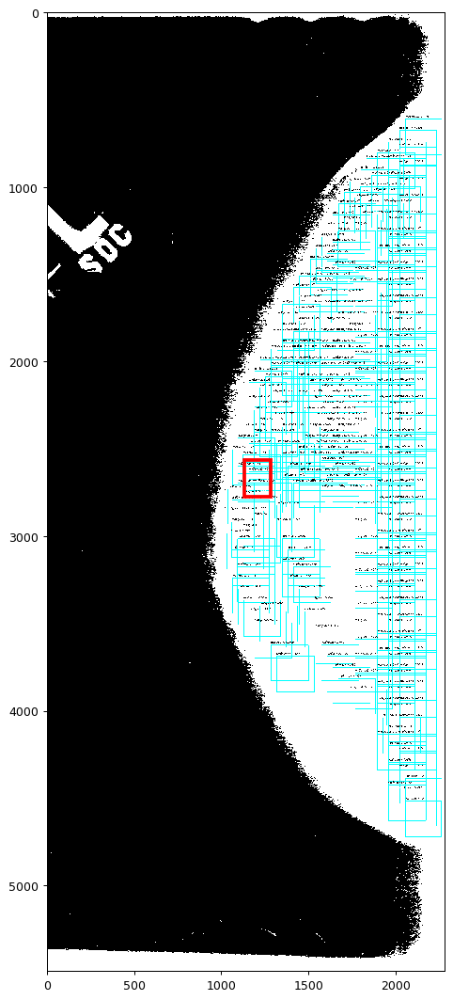

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


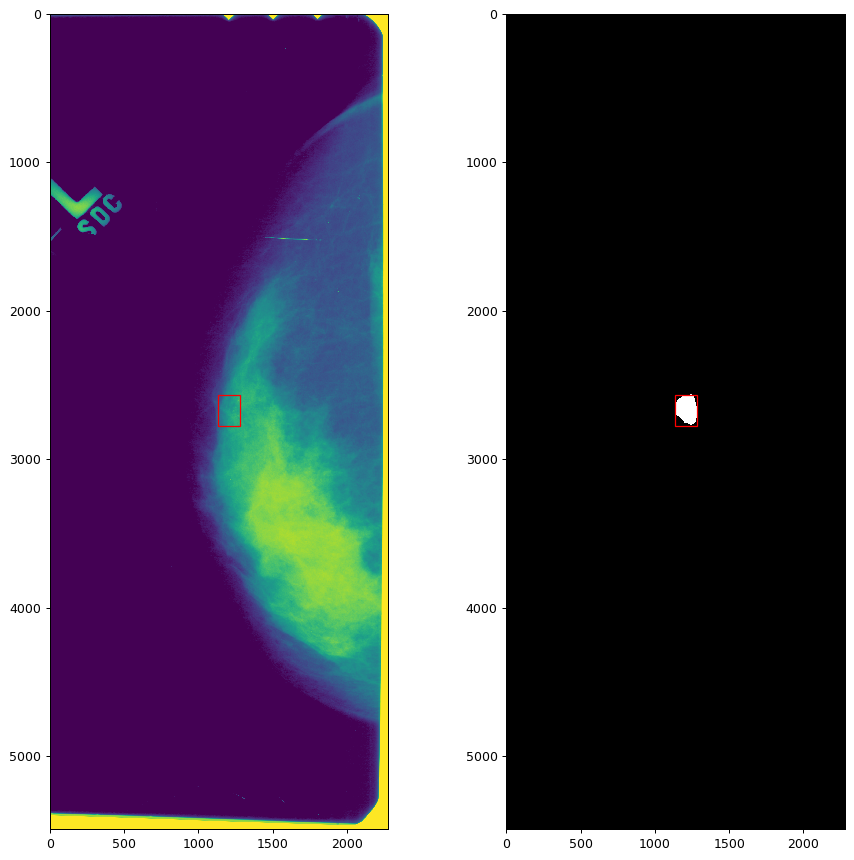

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  13.523553848266602
actual: benign
predicted: malignant


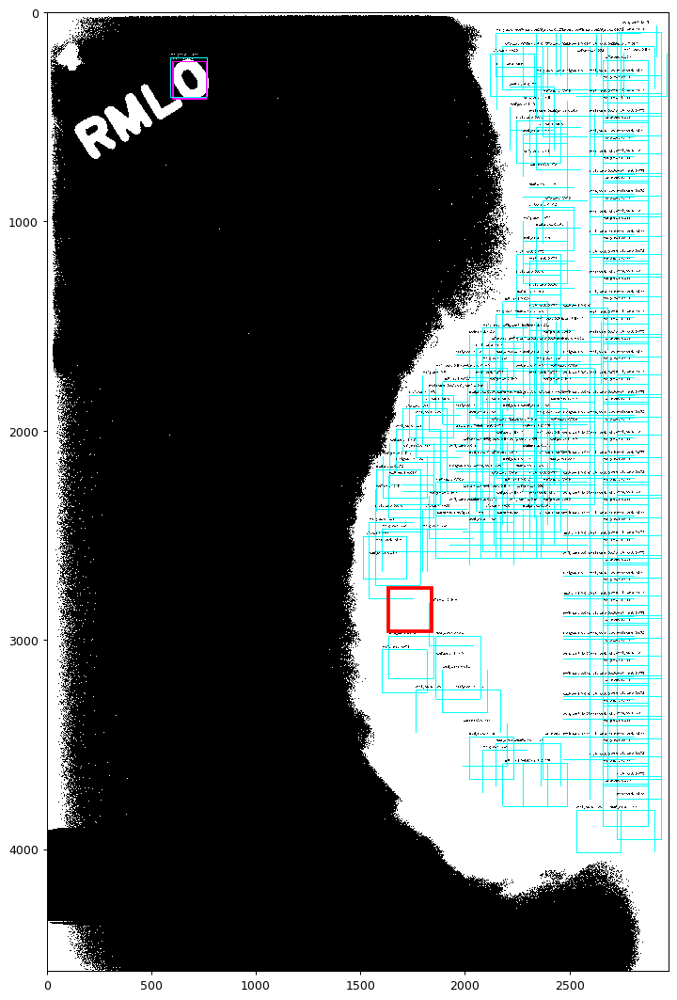

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


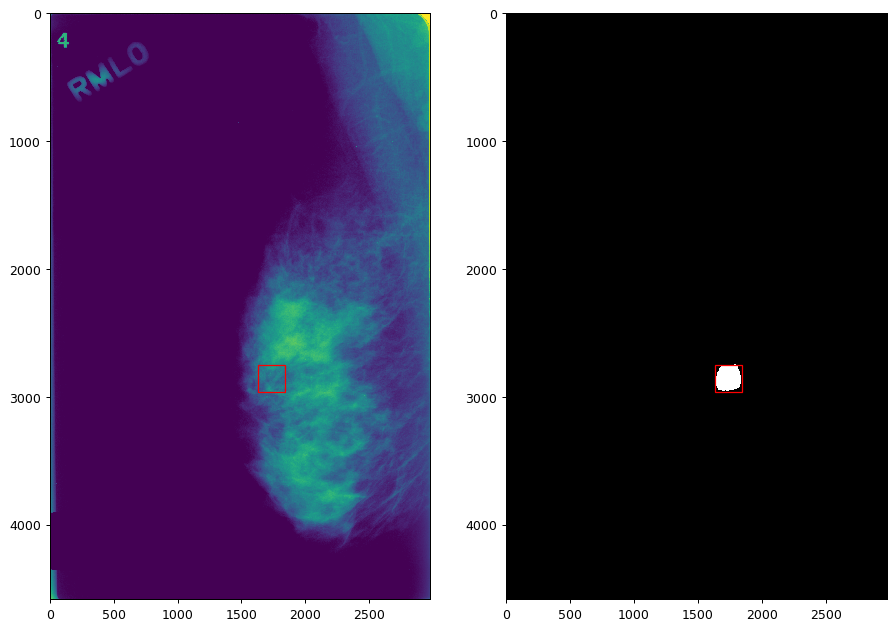

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  16.501909971237183
actual: benign
predicted: malignant


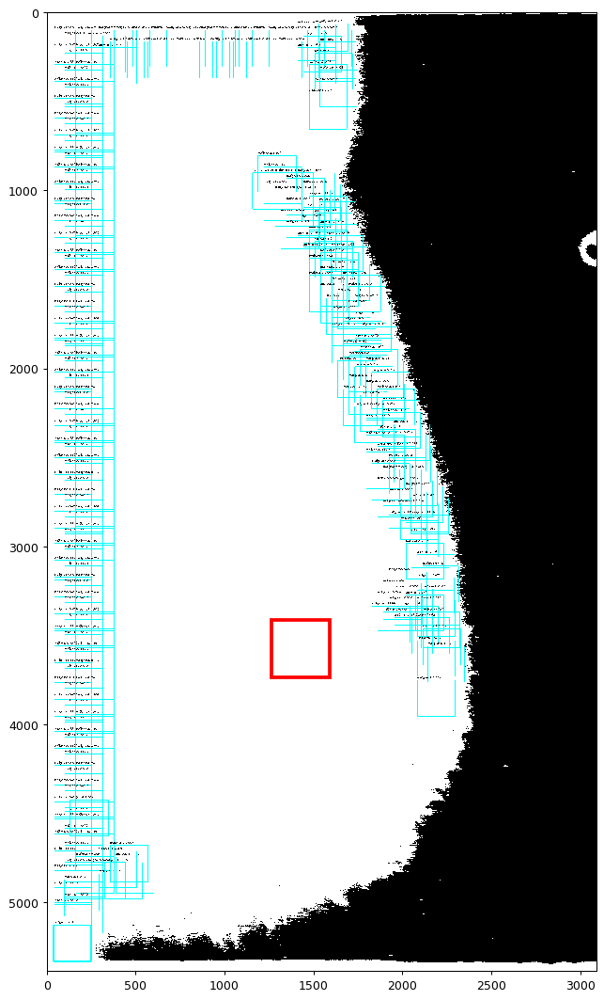

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


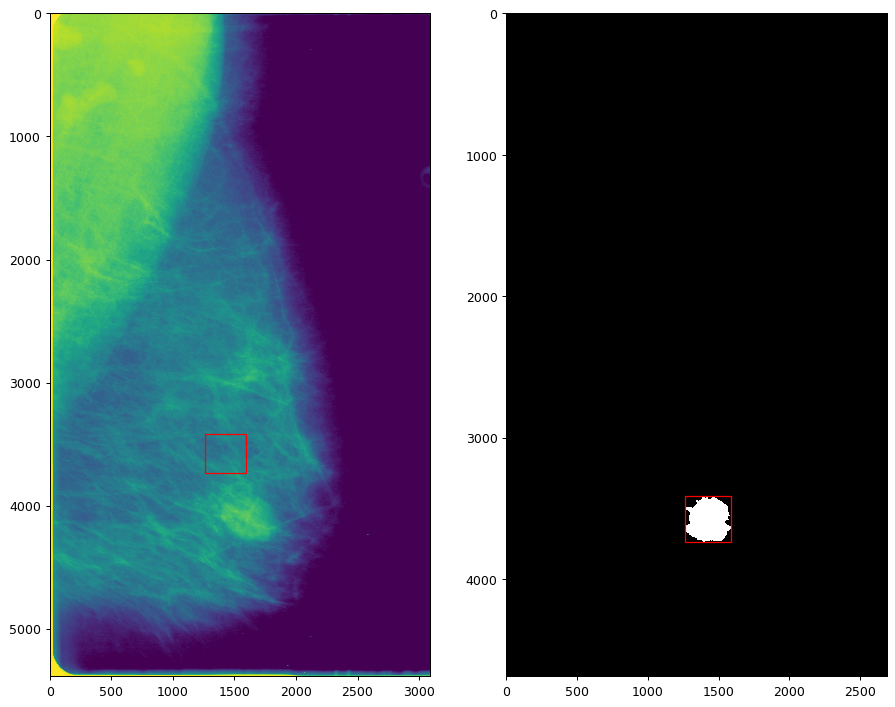

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  12.766406059265137
actual: benign
predicted: malignant


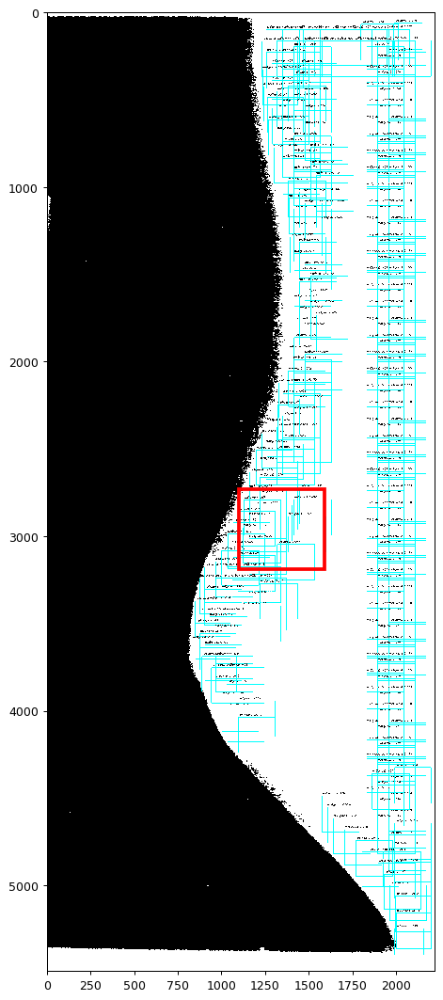

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


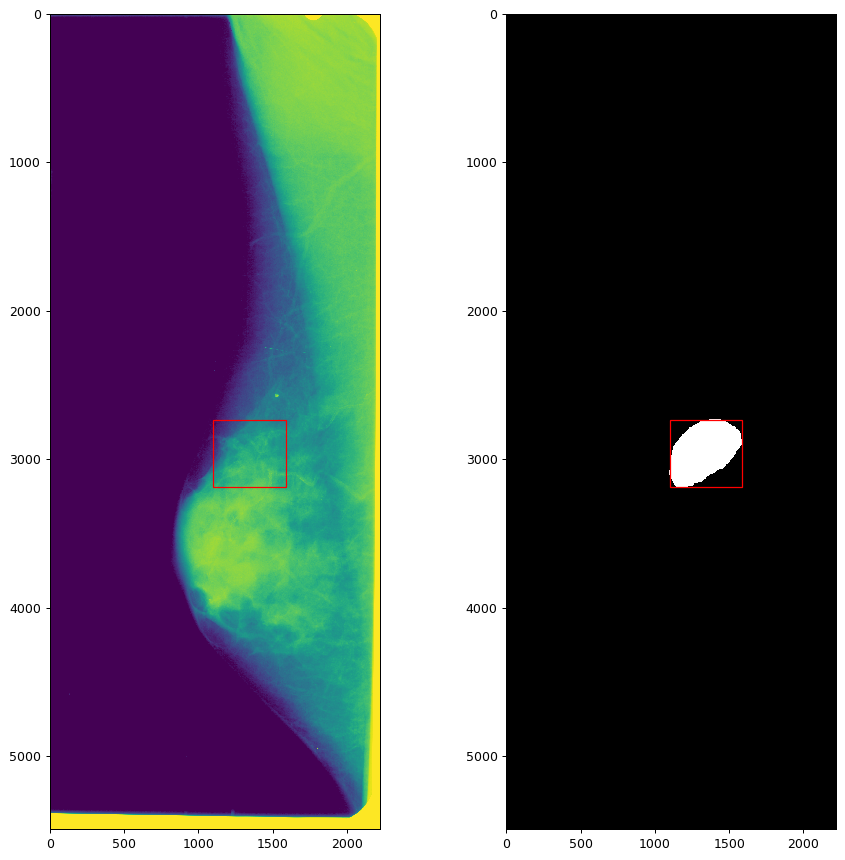

processing time:  27.261306047439575
actual: benign
predicted: malignant


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


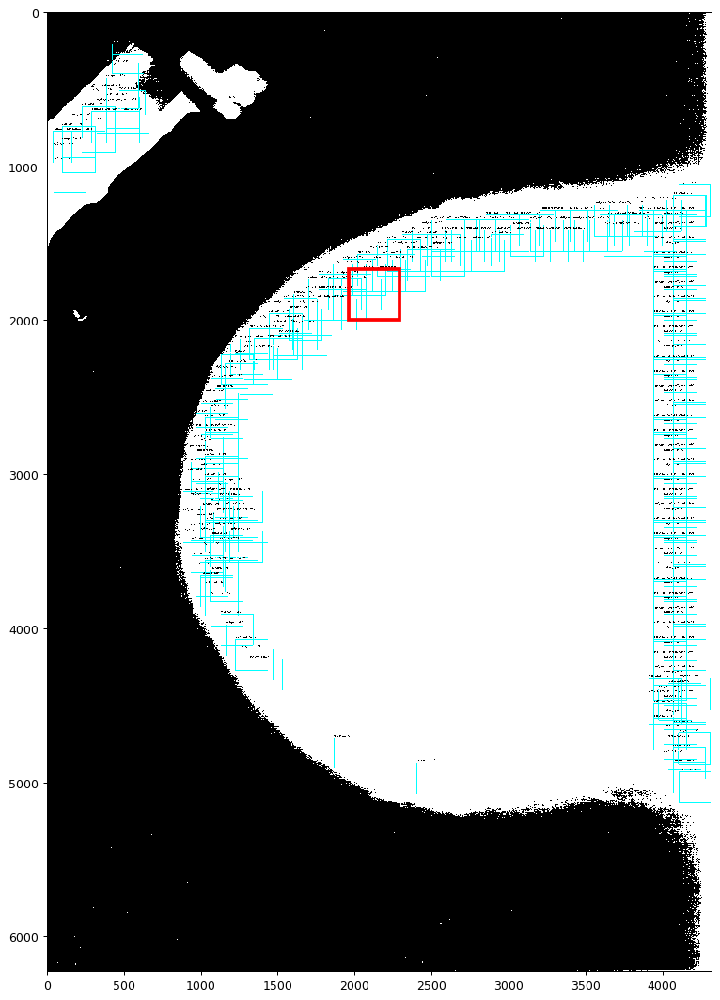

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


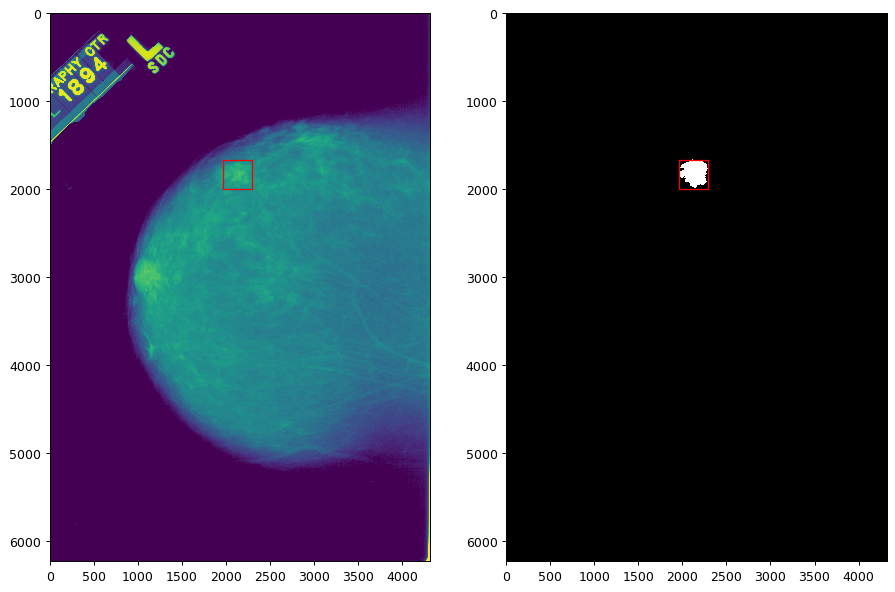

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  11.736441135406494
actual: malignant
predicted: malignant


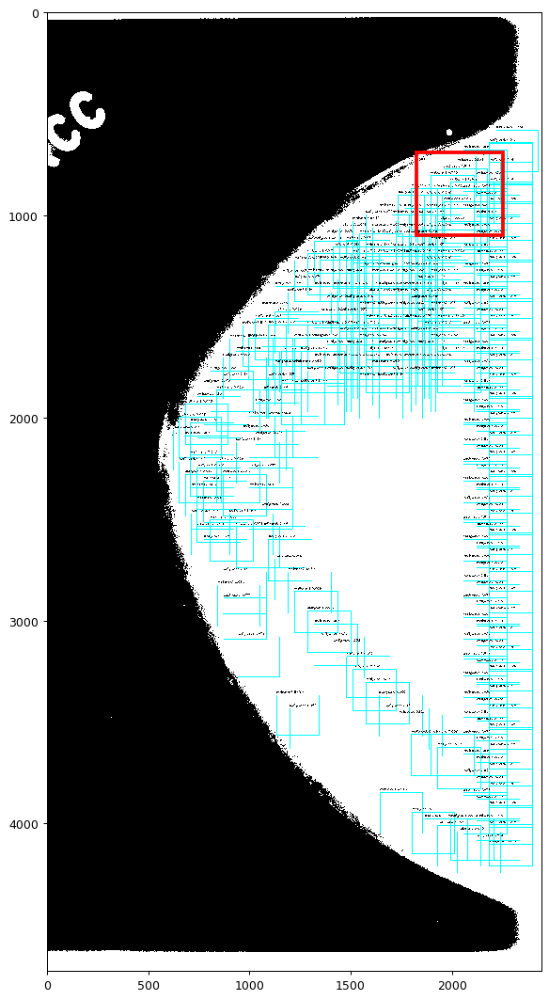

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


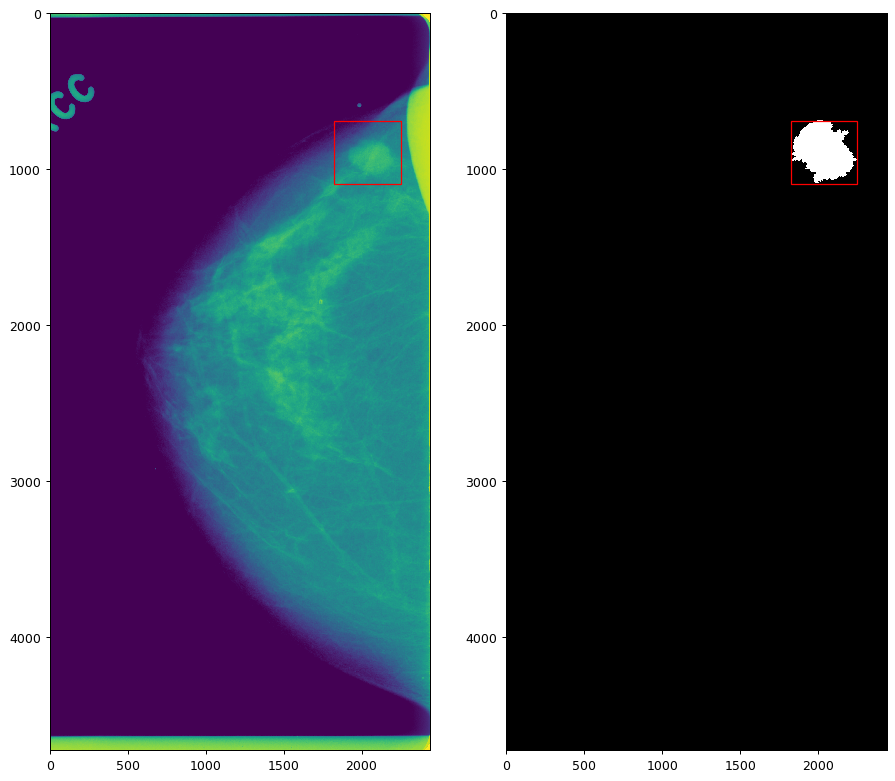

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  15.623178005218506
actual: benign
predicted: malignant


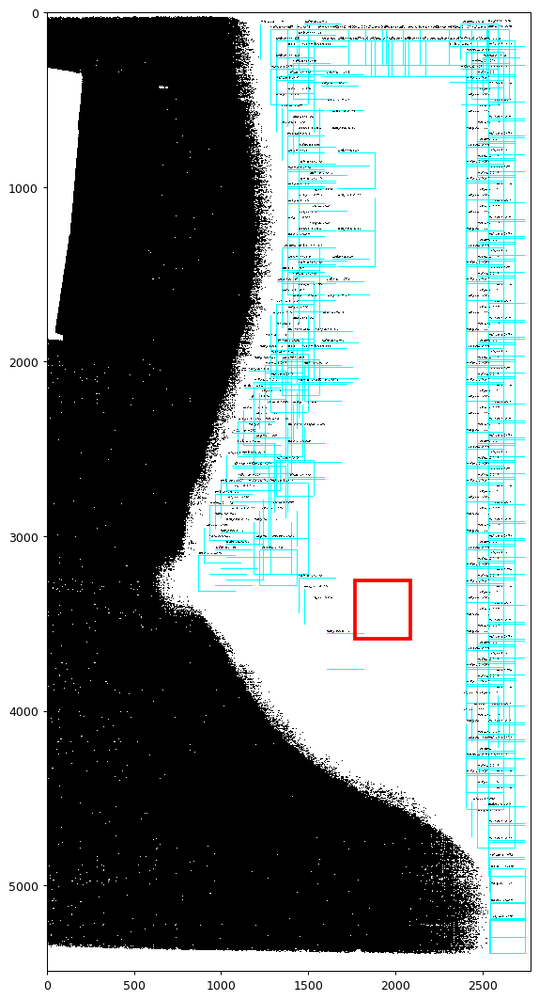

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


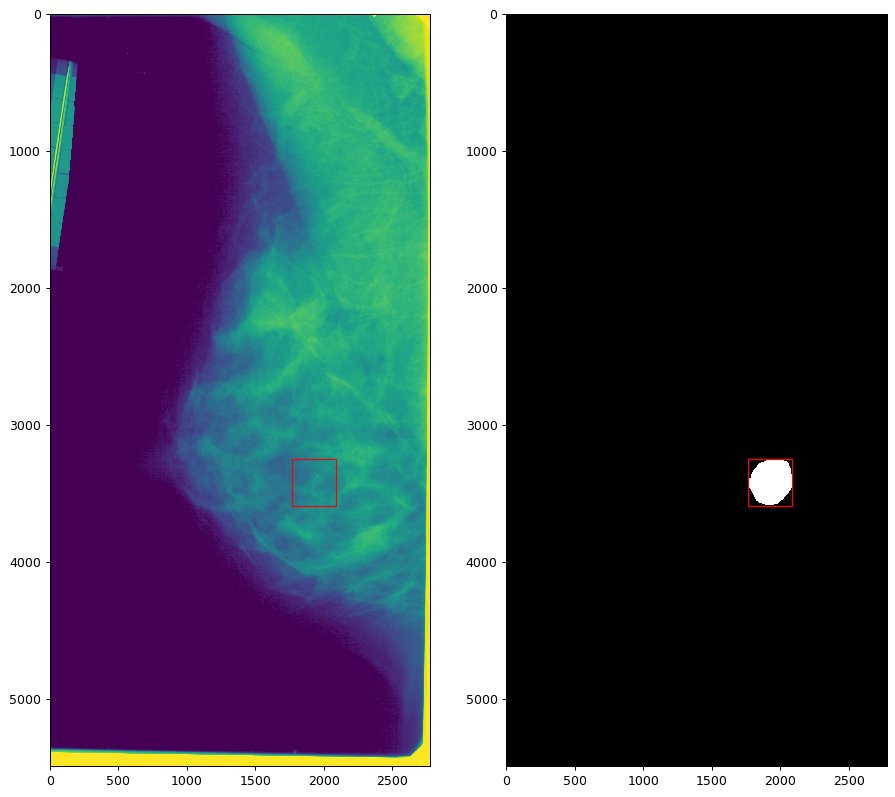

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  19.927676916122437
actual: benign
predicted: malignant


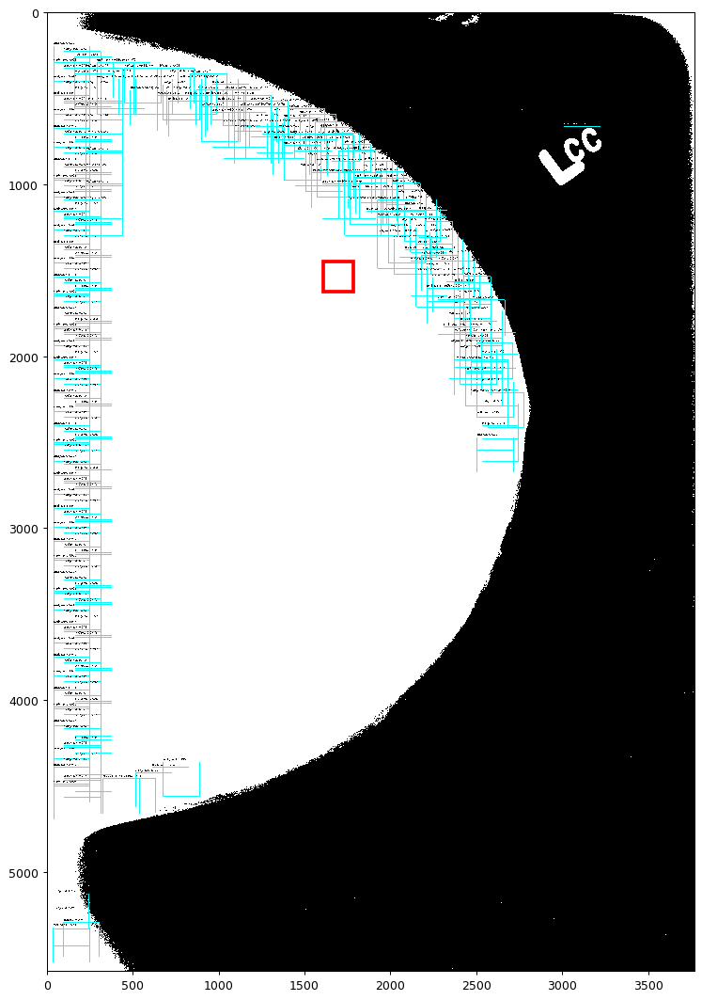

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


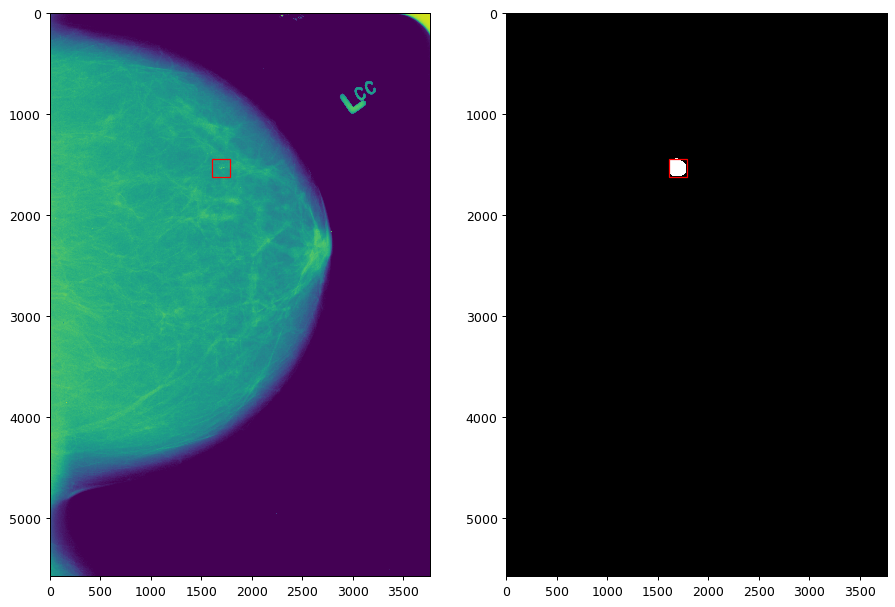

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  13.29051685333252
actual: malignant
predicted: malignant


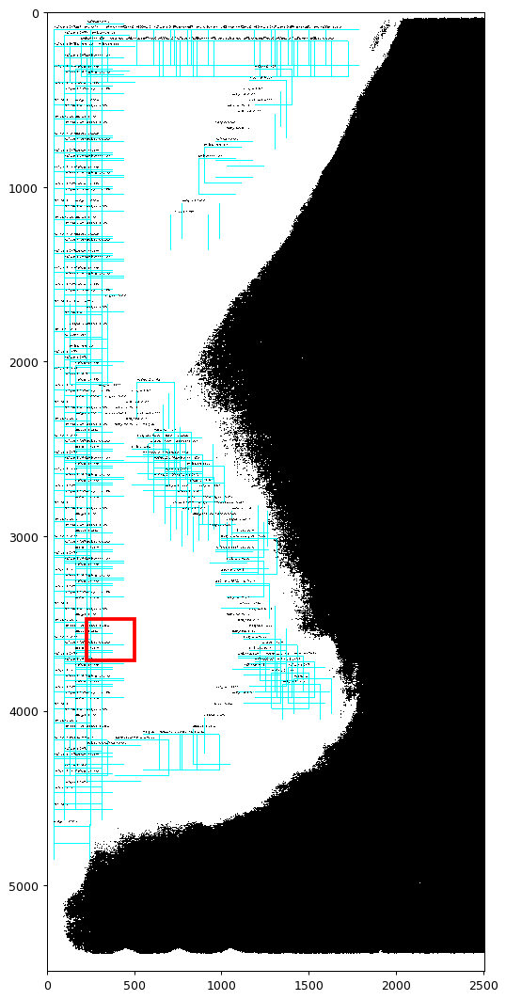

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


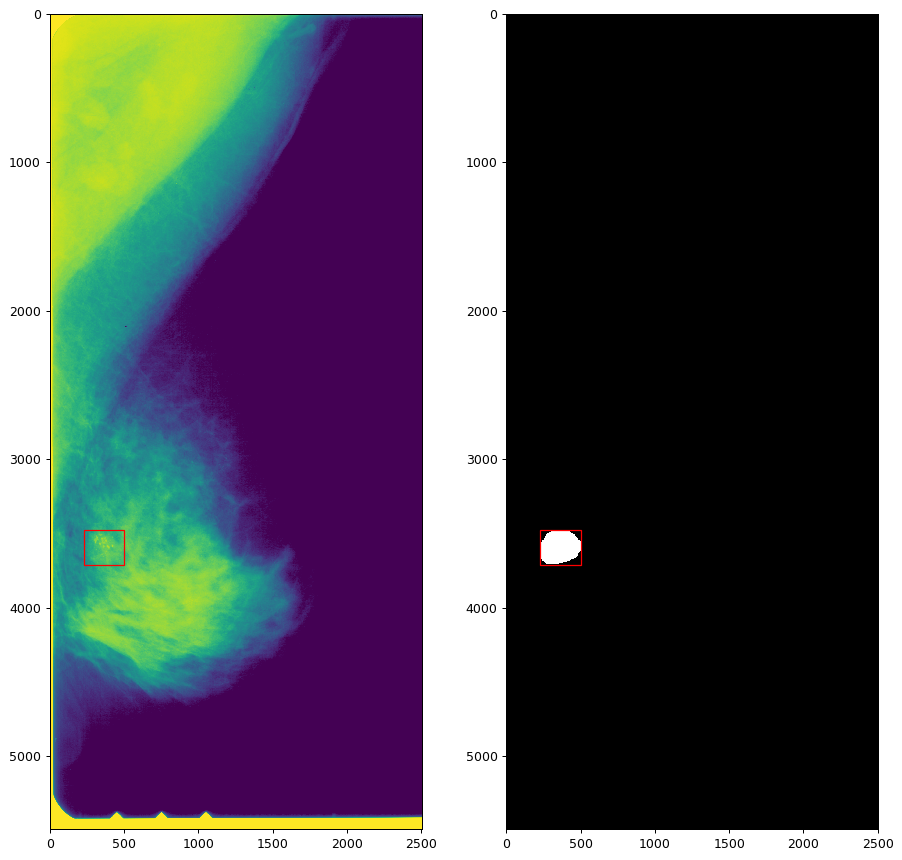

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  19.594754219055176
actual: benign
predicted: malignant


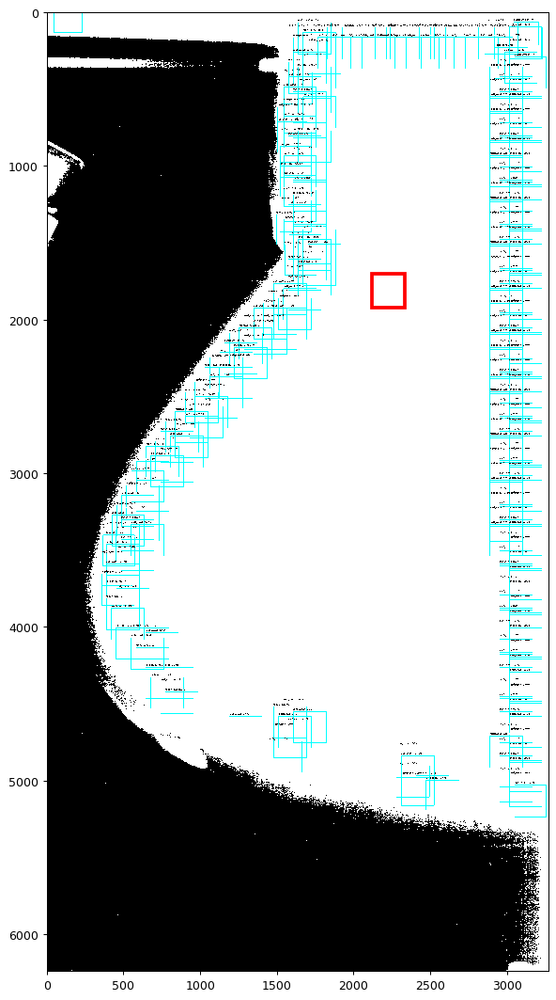

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


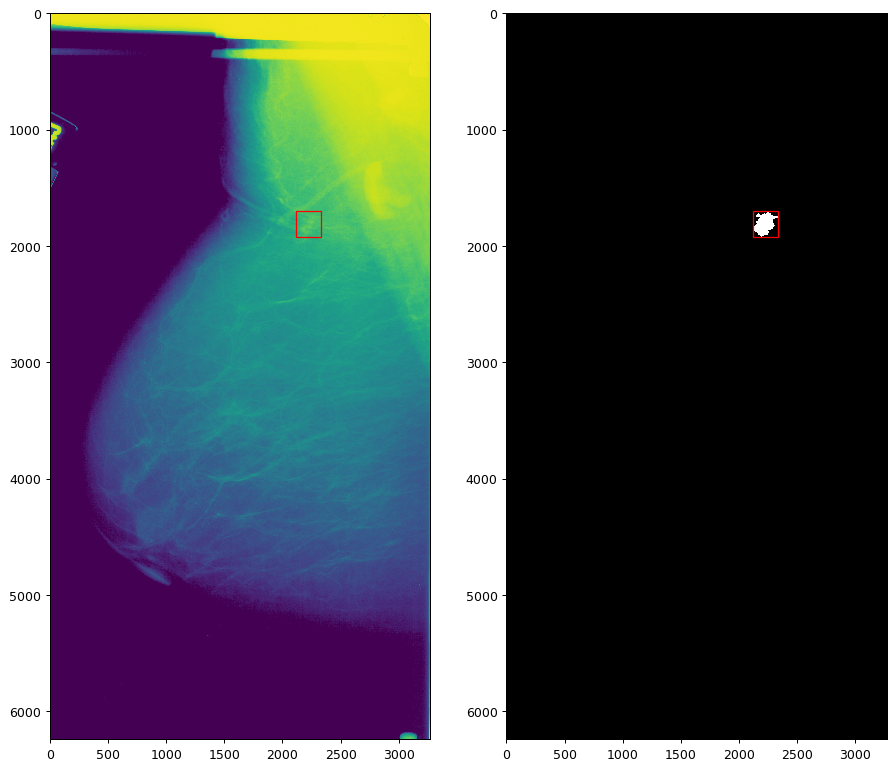

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


processing time:  12.318541765213013
actual: benign
predicted: malignant


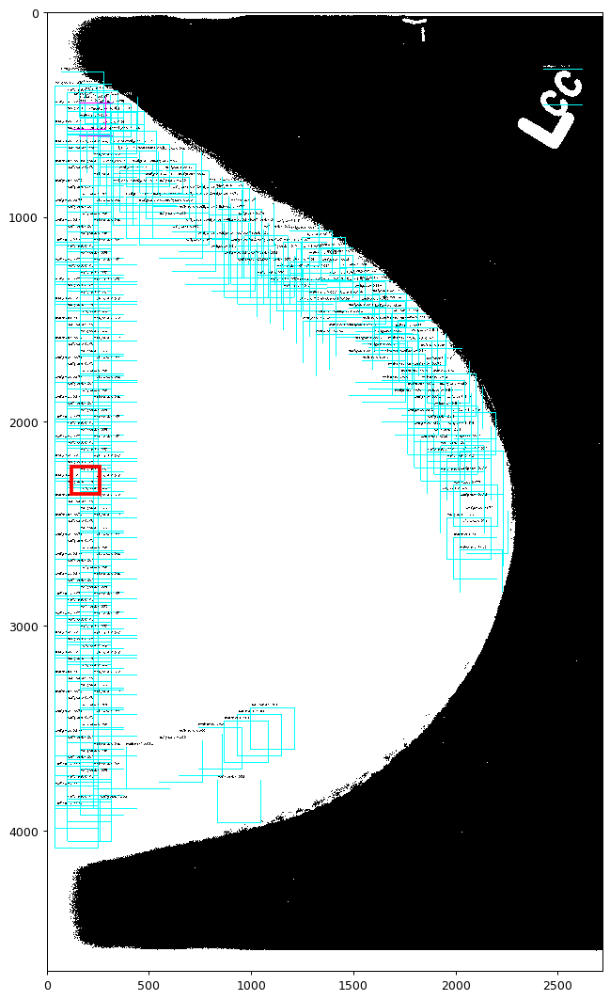

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


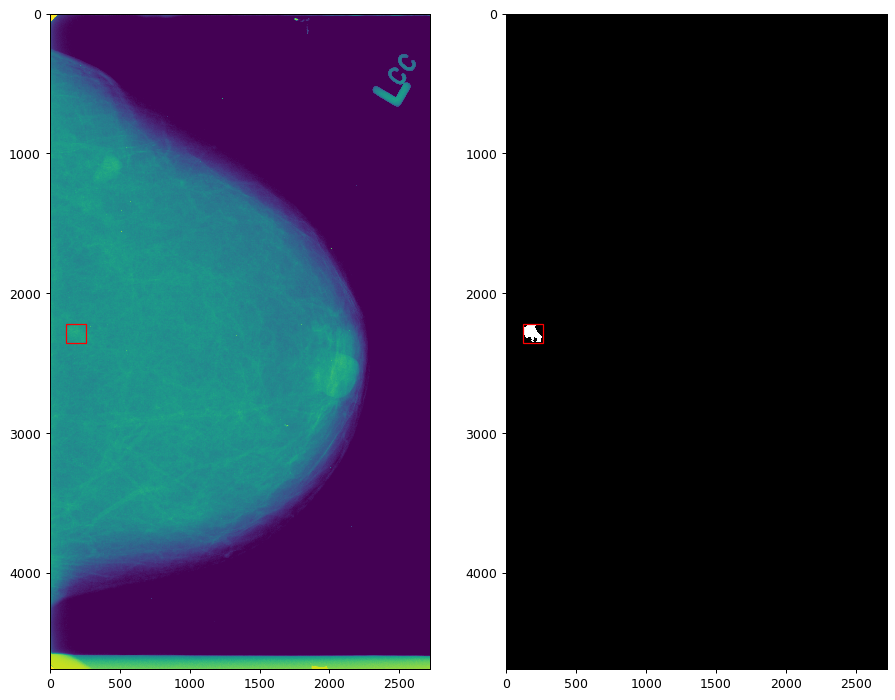

In [60]:
# load image
counter = 0
for idx, row in test_image_data.iterrows():
    if counter > 50:
        break
    actual = idx.split('_')[-1].lower()
    counter += 1
    image = img_to_array(load_img(row['path']))
    x1, y1, x2, y2 = row['box']
    width = x2 - x1
    height = y2 - y1

    mask_path = '/Users/jacksimonson/Springboard_Work/data/test-mask/{}.png'.format(idx)
    mask_im = img_to_array(load_img(mask_path))


    # process image
    start = time.time()
    boxes, scores, labels = model.predict(np.expand_dims(image, axis=0))
    print("processing time: ", time.time() - start)
    print('actual: {}'.format(actual))    
    x = 1 if np.mean(labels) > 0.5 else 0
    print('predicted: {}'.format(labels_to_names[x]))

    plt.figure(figsize=(15, 15), dpi = 90)

    # visualize detections
    draw_detections(image, boxes, scores, labels)
    rect2 = patches.Rectangle((x1,y1),width,height,linewidth=3,edgecolor='r',facecolor='none')
    plt.gca().add_patch(rect2)
    plt.imshow(image)
    plt.show()
    

    
    # plot alongside mask
    im = np.array(Image.open(row['path']), dtype=np.uint64)
    mask_im = img_to_array(load_img(mask_path))

    # Create a Rectangle patch
    rect = patches.Rectangle((x1,y1),width,height,linewidth=1,edgecolor='r',facecolor='none')
    rect2 = patches.Rectangle((x1,y1),width,height,linewidth=1,edgecolor='r',facecolor='none')
    # Create figure and axes
    fig,ax = plt.subplots(1,2, figsize=(12,12), dpi = 90)
    ax[0].imshow(im)
    ax[0].add_patch(rect)
    ax[1].imshow(mask_im)
    ax[1].add_patch(rect2)
    plt.show()